# MOBILE PRICE CLASSIFICATION


Mobile Price Range Classification is a classification problem that involves building a model to classify mobile phones into different price ranges based on their features. The dataset contains various features of mobile phones such as battery life, RAM, internal storage, camera quality, etc., along with their price ranges. The goal is to build a model that can accurately predict the price range of a mobile phone based on its features.

The dataset contains 2,000 mobile phones with 20 features for each phone. The features include:

- Battery power
- Blue tooth
- Clock speed
- Dual sim support
- Front camera mega pixels
- 4G support
- Internal memory
- Mobile depth
- Mobile weight
- NFC
- Number of cores
- Primary camera mega pixels
- Pixel resolution height
- Pixel resolution width
- RAM
- Screen height
- Screen width
- Touch screen
- WiFi
- Price range (the target variable)

The price range is divided into four categories:

- Low cost (0)
- Medium cost (1)
- High cost (2)
- Very high cost (3)

LINK TO DATASET: https://www.kaggle.com/datasets/iabhishekofficial/mobile-price-classification?select=train.csv

# About Dataset
- battery_power: Total energy a battery can store in one time measured in mAh
- blue: Has bluetooth or not

- clock_speed: speed at which microprocessor executes instructions

- dual_sim: Has dual sim support or not

- fc: Front Camera mega pixels

- four_g: Has 4G or not

- int_memory: Internal Memory in Gigabytes

- m_dep: Mobile Depth in cm

- mobile_wt: Weight of mobile phone

- n_cores: Number of cores of processor

- pc: Primary Camera mega pixels

- px_height: Pixel Resolution Height

- px_width: Pixel Resolution Width

- ram: Random Access Memory in Mega Bytes

- sc_h: Screen Height of mobile in cm

- sc_w: Screen Width of mobile in cm

- talk_time: longest time that a single battery charge will last when you are

- three_g: Has 3G or not

- touch_screen: Has touch screen or not

- wifi: Has wifi or not

- price_range: This is the target variable with value of 0(low cost), 1(medium cost), 2(high cost) and 3(very high cost).

# Import libraries

In [149]:
# for data cleaning, preprocessing, visualization, transformations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import StandardScaler, RobustScaler, OneHotEncoder, LabelEncoder, FunctionTransformer, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split,KFold,cross_val_score,cross_val_predict, GridSearchCV, RandomizedSearchCV
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.feature_selection import SelectKBest, chi2, f_regression, RFE
import regex
import math
import scipy
#metrics 
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix,roc_auc_score, roc_curve, classification_report

#Supervised models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

#deep learning models
from sklearn.neural_network import MLPClassifier
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

#saving model
import pickle


In [150]:
pd.options.display.max_columns=1000

data = pd.read_csv("/Users/USER/Documents/DATASETS/mobile_price_classification/train.csv")
data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1


In [151]:
data.shape

(2000, 21)

In [152]:
df = data.copy()

In [153]:
df=df.rename(columns={'blue':'Bluetooth',
                   'battery_power':'Battery_power',
                   'clock_speed':'Clock_speed',
                   'dual_sim':'Dual_sim',
                   'four_g':'4G_Network',
                   'int_memory':'Internal_memory',
                   'm_dep':'Mobile_Depth_in_cm',
                   'mobile_wt':' Weight_of_mobile_phone',
                   'n_cores':'Number_of_processor_cores',
                   'px_height': 'Pixel_Resolution_Height',
                   'px_width': 'Pixel_Resolution_Width',
                   'ram': 'Random_Access_Memory_in_MB',
                   'sc_h': 'Screen_Height_of_mobile_in_cm',
                   'sc_w': 'Screen_Width_of_mobile_in_cm',
                   'talk_time': 'Talk_time',
                   'three_g':'3G_Network',
                   'touch_screen':'Touch_screen',
                   'wifi':'WiFi',
                   'price_range':'Price_class',
                      'fc':'Front_Camera_MP'
                  })
df=df.reset_index(drop=True)
df.head()

,Battery_power,Bluetooth,Clock_speed,Dual_sim,Front_Camera_MP,4G_Network,Internal_memory,Mobile_Depth_in_cm,Weight_of_mobile_phone,Number_of_processor_cores,pc,Pixel_Resolution_Height,Pixel_Resolution_Width,Random_Access_Memory_in_MB,Screen_Height_of_mobile_in_cm,Screen_Width_of_mobile_in_cm,Talk_time,3G_Network,Touch_screen,WiFi,Price_class
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1


# Converting discrete to object type for easier visualization


In [154]:
b_map = {0:'No',1:'Yes'}
p_map={ 0:'low cost', 1:'medium cost' ,2:'high cost',3:'very high cost'}

for i in df[['Bluetooth','Dual_sim','4G_Network','3G_Network','Touch_screen','WiFi']]:
    df[i] = df[i].map(b_map)
    
df['Price_class'] = df['Price_class'].map(p_map)

In [155]:
df.head()

,Battery_power,Bluetooth,Clock_speed,Dual_sim,Front_Camera_MP,4G_Network,Internal_memory,Mobile_Depth_in_cm,Weight_of_mobile_phone,Number_of_processor_cores,pc,Pixel_Resolution_Height,Pixel_Resolution_Width,Random_Access_Memory_in_MB,Screen_Height_of_mobile_in_cm,Screen_Width_of_mobile_in_cm,Talk_time,3G_Network,Touch_screen,WiFi,Price_class
0,842,No,2.2,No,1,No,7,0.6,188,2,2,20,756,2549,9,7,19,No,No,Yes,medium cost
1,1021,Yes,0.5,Yes,0,Yes,53,0.7,136,3,6,905,1988,2631,17,3,7,Yes,Yes,No,high cost
2,563,Yes,0.5,Yes,2,Yes,41,0.9,145,5,6,1263,1716,2603,11,2,9,Yes,Yes,No,high cost
3,615,Yes,2.5,No,0,No,10,0.8,131,6,9,1216,1786,2769,16,8,11,Yes,No,No,high cost
4,1821,Yes,1.2,No,13,Yes,44,0.6,141,2,14,1208,1212,1411,8,2,15,Yes,Yes,No,medium cost


In [156]:
df.shape

(2000, 21)

In [157]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Battery_power                  2000 non-null   int64  
 1   Bluetooth                      2000 non-null   object 
 2   Clock_speed                    2000 non-null   float64
 3   Dual_sim                       2000 non-null   object 
 4   Front_Camera_MP                2000 non-null   int64  
 5   4G_Network                     2000 non-null   object 
 6   Internal_memory                2000 non-null   int64  
 7   Mobile_Depth_in_cm             2000 non-null   float64
 8    Weight_of_mobile_phone        2000 non-null   int64  
 9   Number_of_processor_cores      2000 non-null   int64  
 10  pc                             2000 non-null   int64  
 11  Pixel_Resolution_Height        2000 non-null   int64  
 12  Pixel_Resolution_Width         2000 non-null   i

In [158]:
#check for duplicated values
df[df.duplicated()]

,Battery_power,Bluetooth,Clock_speed,Dual_sim,Front_Camera_MP,4G_Network,Internal_memory,Mobile_Depth_in_cm,Weight_of_mobile_phone,Number_of_processor_cores,pc,Pixel_Resolution_Height,Pixel_Resolution_Width,Random_Access_Memory_in_MB,Screen_Height_of_mobile_in_cm,Screen_Width_of_mobile_in_cm,Talk_time,3G_Network,Touch_screen,WiFi,Price_class


In [159]:
df.describe()

,Battery_power,Clock_speed,Front_Camera_MP,Internal_memory,Mobile_Depth_in_cm,Weight_of_mobile_phone,Number_of_processor_cores,pc,Pixel_Resolution_Height,Pixel_Resolution_Width,Random_Access_Memory_in_MB,Screen_Height_of_mobile_in_cm,Screen_Width_of_mobile_in_cm,Talk_time
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,1.522250,4.309500,32.046500,0.501750,140.249000,4.520500,9.916500,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000
std,439.418206,0.816004,4.341444,18.145715,0.288416,35.399655,2.287837,6.064315,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955
min,501.000000,0.500000,0.000000,2.000000,0.100000,80.000000,1.000000,0.000000,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000
25%,851.750000,0.700000,1.000000,16.000000,0.200000,109.000000,3.000000,5.000000,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000
50%,1226.000000,1.500000,3.000000,32.000000,0.500000,141.000000,4.000000,10.000000,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000
75%,1615.250000,2.200000,7.000000,48.000000,0.800000,170.000000,7.000000,15.000000,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000
max,1998.000000,3.000000,19.000000,64.000000,1.000000,200.000000,8.000000,20.000000,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000


In [160]:
df.describe(include='O')

,Bluetooth,Dual_sim,4G_Network,3G_Network,Touch_screen,WiFi,Price_class
count,2000,2000,2000,2000,2000,2000,2000
unique,2,2,2,2,2,2,4
top,No,Yes,Yes,Yes,Yes,Yes,high cost
freq,1010,1019,1043,1523,1006,1014,500


# Checking for whitespaces in data

In [161]:
#whitespaces in rows
def whitespace_check(column):
    return df.loc[np.where(df[column].apply(lambda x:x == ' '))]

for i in df.columns:
    print(whitespace_check(i))
    print()

Empty DataFrame
Columns: [Battery_power, Bluetooth, Clock_speed, Dual_sim, Front_Camera_MP, 4G_Network, Internal_memory, Mobile_Depth_in_cm,  Weight_of_mobile_phone, Number_of_processor_cores, pc, Pixel_Resolution_Height, Pixel_Resolution_Width, Random_Access_Memory_in_MB, Screen_Height_of_mobile_in_cm, Screen_Width_of_mobile_in_cm, Talk_time, 3G_Network, Touch_screen, WiFi, Price_class]
Index: []

Empty DataFrame
Columns: [Battery_power, Bluetooth, Clock_speed, Dual_sim, Front_Camera_MP, 4G_Network, Internal_memory, Mobile_Depth_in_cm,  Weight_of_mobile_phone, Number_of_processor_cores, pc, Pixel_Resolution_Height, Pixel_Resolution_Width, Random_Access_Memory_in_MB, Screen_Height_of_mobile_in_cm, Screen_Width_of_mobile_in_cm, Talk_time, 3G_Network, Touch_screen, WiFi, Price_class]
Index: []

Empty DataFrame
Columns: [Battery_power, Bluetooth, Clock_speed, Dual_sim, Front_Camera_MP, 4G_Network, Internal_memory, Mobile_Depth_in_cm,  Weight_of_mobile_phone, Number_of_processor_cores, pc,

In [162]:
#whitespaces in column name
[i for i in df.columns if i.startswith(' ') or i.endswith(' ')]

[' Weight_of_mobile_phone']

In [163]:
df  = df.rename(columns={' Weight_of_mobile_phone':'Weight_of_mobile_phone'})

# Checking Unique values

In [164]:
for i in df.columns:
    print(i,':',df[i].unique())
    print()

Battery_power : [ 842 1021  563 ... 1139 1467  858]

Bluetooth : ['No' 'Yes']

Clock_speed : [2.2 0.5 2.5 1.2 1.7 0.6 2.9 2.8 2.1 1.  0.9 1.1 2.6 1.4 1.6 2.7 1.3 2.3
 2.  1.8 3.  1.5 1.9 2.4 0.8 0.7]

Dual_sim : ['No' 'Yes']

Front_Camera_MP : [ 1  0  2 13  3  4  5  7 11 12 16  6 15  8  9 10 18 17 14 19]

4G_Network : ['No' 'Yes']

Internal_memory : [ 7 53 41 10 44 22 24  9 33 17 52 46 13 23 49 19 39 47 38  8 57 51 21  5
 60 61  6 11 50 34 20 27 42 40 64 14 63 43 16 48 12 55 36 30 45 29 58 25
  3 54 15 37 31 32  4 18  2 56 26 35 59 28 62]

Mobile_Depth_in_cm : [0.6 0.7 0.9 0.8 0.1 0.5 1.  0.3 0.4 0.2]

Weight_of_mobile_phone : [188 136 145 131 141 164 139 187 174  93 182 177 159 198 185 196 121 101
  81 156 199 114 111 132 143  96 200  88 150 107 100 157 160 119  87 152
 166 110 118 162 127 109 102 104 148 180 128 134 144 168 155 165  80 138
 142  90 197 172 116  85 163 178 171 103  83 140 194 146 192 106 135 153
  89  82 130 189 181  99 184 195 108 133 179 147 137 190 176  84  97 124


In [165]:
for i in df.columns:
    print(i,":",df[i].nunique())
    print()

Battery_power : 1094

Bluetooth : 2

Clock_speed : 26

Dual_sim : 2

Front_Camera_MP : 20

4G_Network : 2

Internal_memory : 63

Mobile_Depth_in_cm : 10

Weight_of_mobile_phone : 121

Number_of_processor_cores : 8

pc : 21

Pixel_Resolution_Height : 1137

Pixel_Resolution_Width : 1109

Random_Access_Memory_in_MB : 1562

Screen_Height_of_mobile_in_cm : 15

Screen_Width_of_mobile_in_cm : 19

Talk_time : 19

3G_Network : 2

Touch_screen : 2

WiFi : 2

Price_class : 4



# Checking for null values

In [166]:
df.isnull().sum()

Battery_power                    0
Bluetooth                        0
Clock_speed                      0
Dual_sim                         0
Front_Camera_MP                  0
4G_Network                       0
Internal_memory                  0
Mobile_Depth_in_cm               0
Weight_of_mobile_phone           0
Number_of_processor_cores        0
pc                               0
Pixel_Resolution_Height          0
Pixel_Resolution_Width           0
Random_Access_Memory_in_MB       0
Screen_Height_of_mobile_in_cm    0
Screen_Width_of_mobile_in_cm     0
Talk_time                        0
3G_Network                       0
Touch_screen                     0
WiFi                             0
Price_class                      0
dtype: int64

# Visualize Cardinality

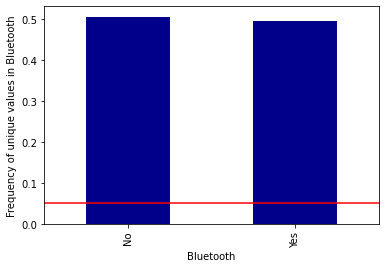

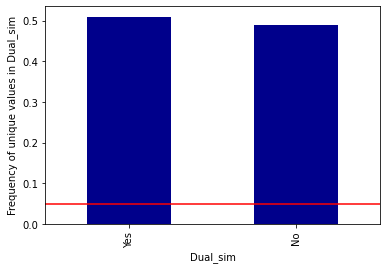

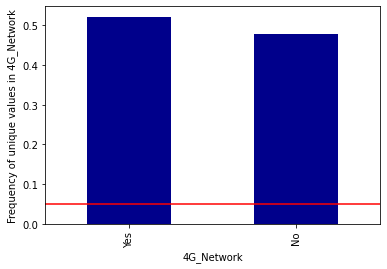

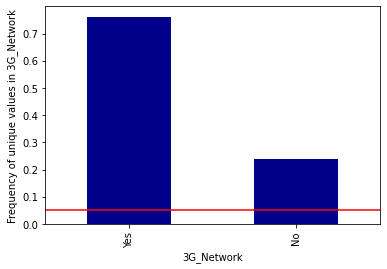

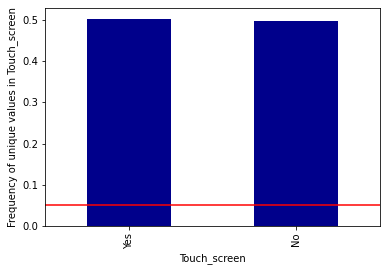

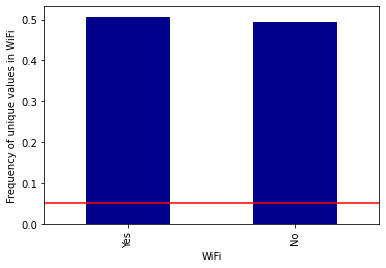

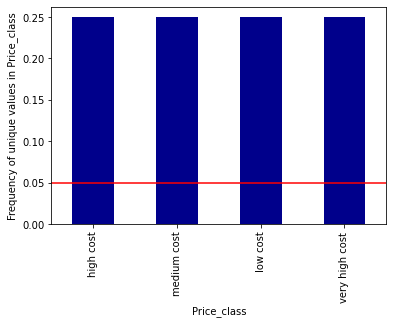

In [167]:
for i in df.select_dtypes('O').columns:
    plt.figure()
    value = df[i].value_counts()/len(df)
    fig = value.plot.bar(color='darkblue')
    fig.axhline(0.05,color='red')
    plt.xlabel(i)
    plt.ylabel(f'Frequency of unique values in {i}')

# UNIVARIATE VISUALIZATION

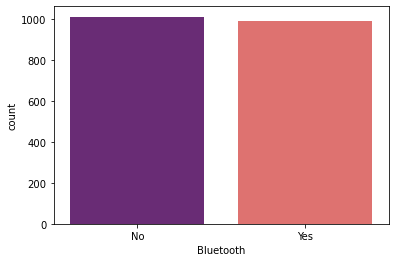

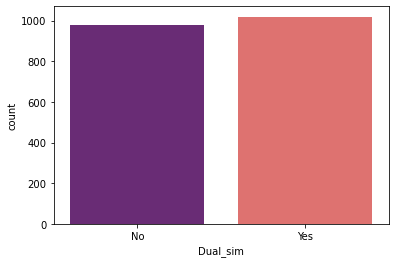

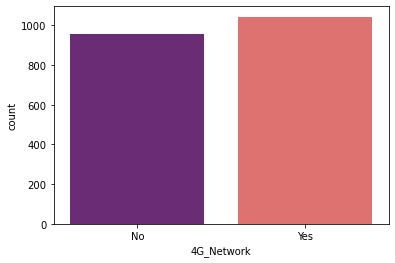

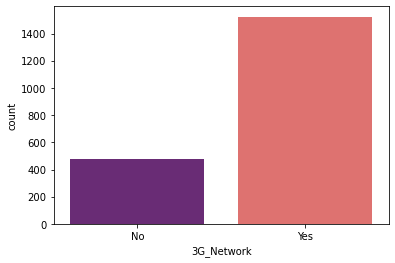

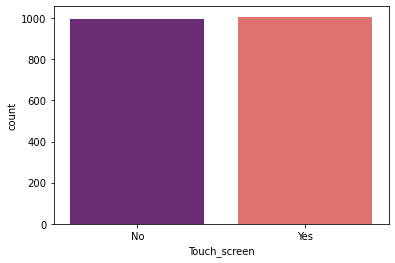

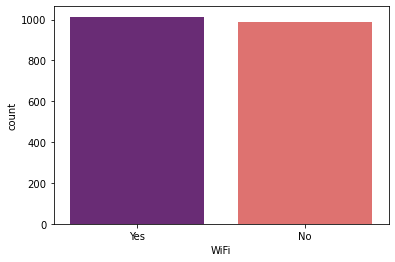

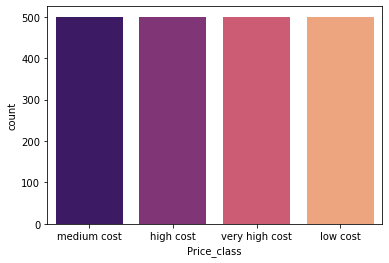

In [168]:
#QUALITATIVE DATA
for i in df.select_dtypes('O').columns:
    plt.figure()
    sns.countplot(data=df,x=i, palette= 'magma')

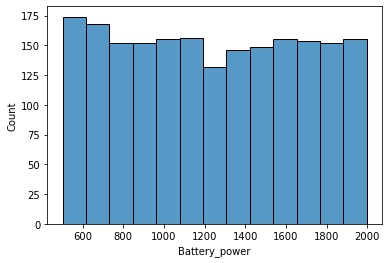

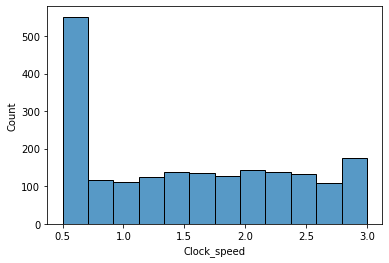

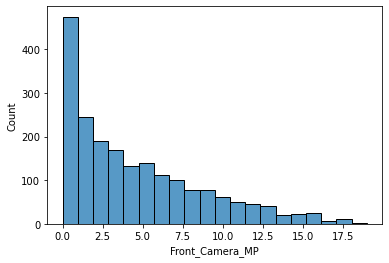

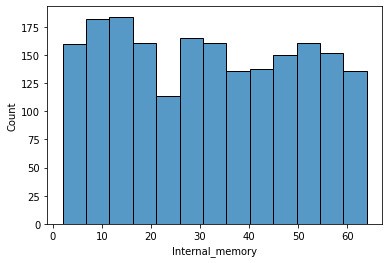

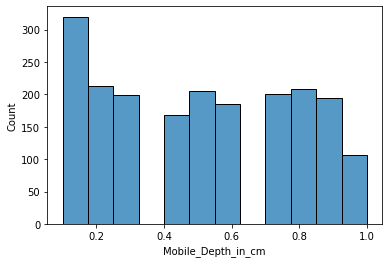

...

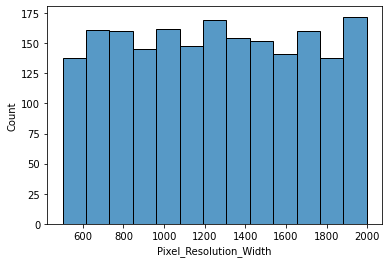

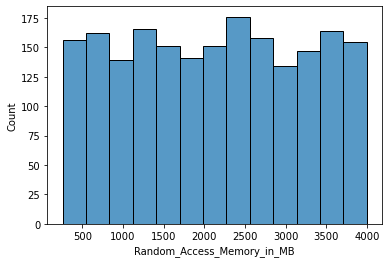

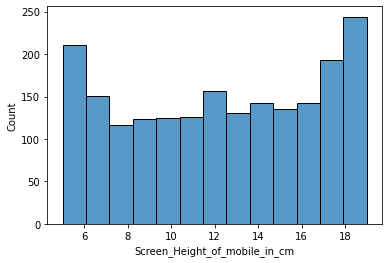

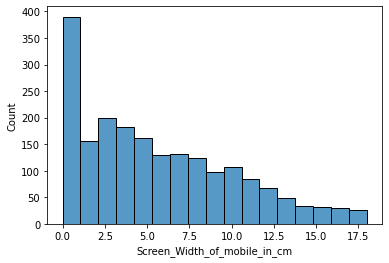

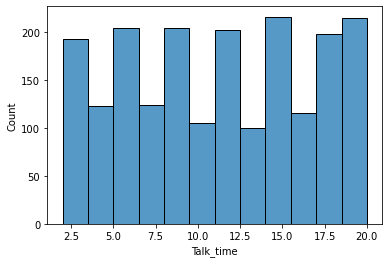

In [169]:
#QUANTITATIVE DATA
for i in df.select_dtypes('number'):
    plt.figure()
    sns.histplot(df[i],)

# DISTRIBUTION OF DATA

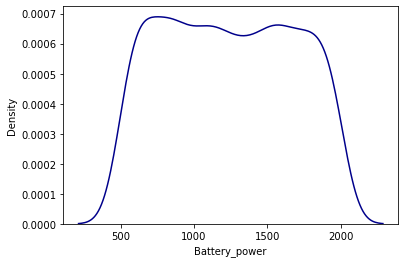

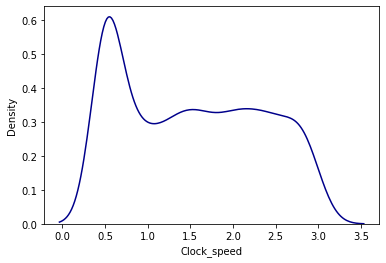

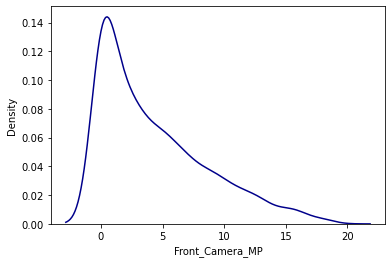

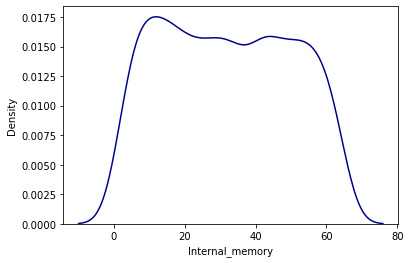

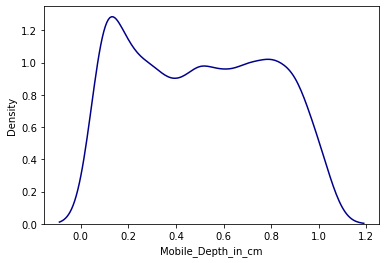

...

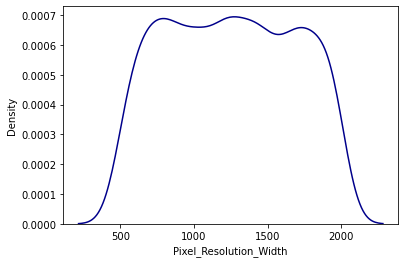

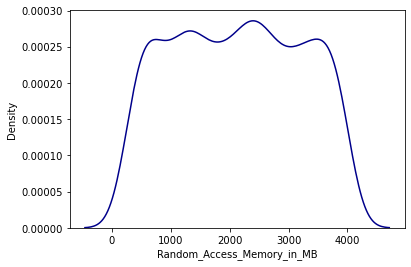

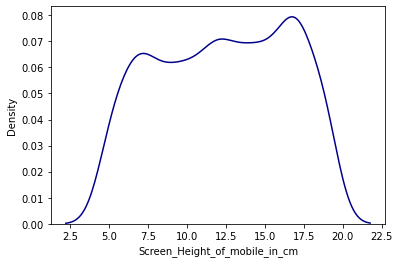

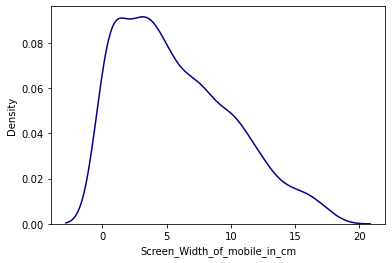

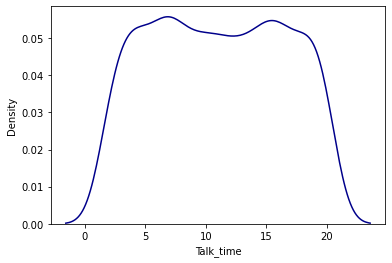

In [170]:
for i in df.select_dtypes('number').columns:
    plt.figure()
    sns.kdeplot(df[i],color='darkblue')

# RELATIONSHIP WITH TARGET VARIABLE

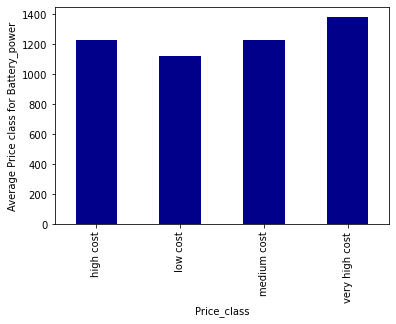

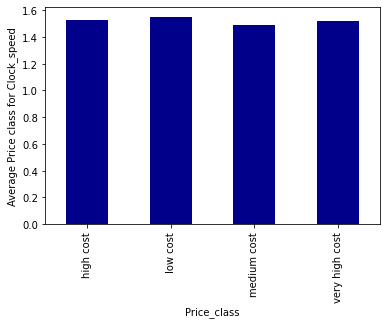

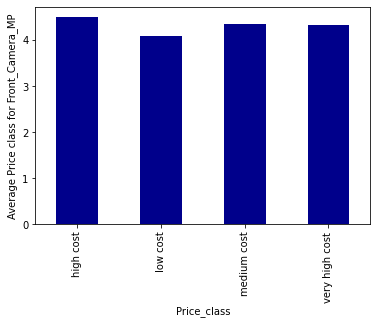

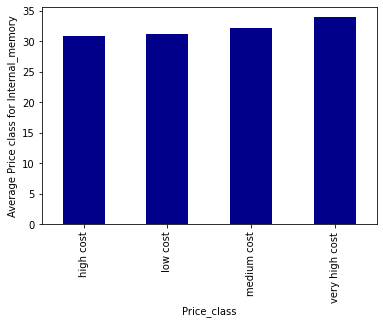

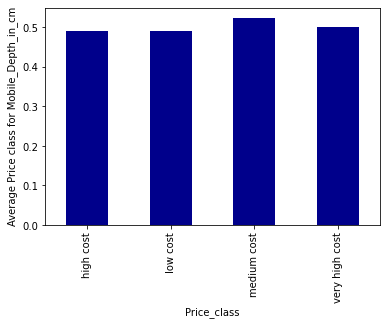

...

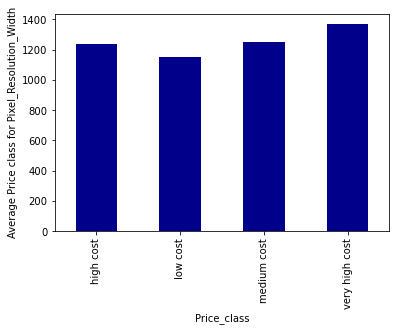

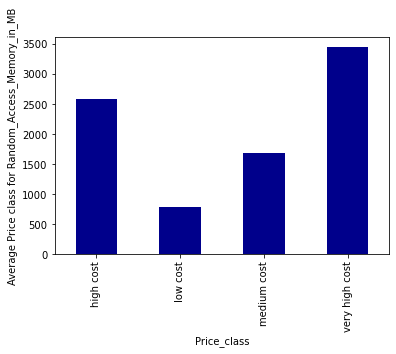

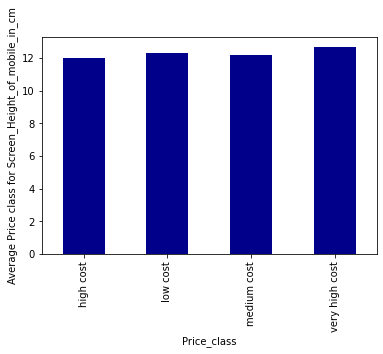

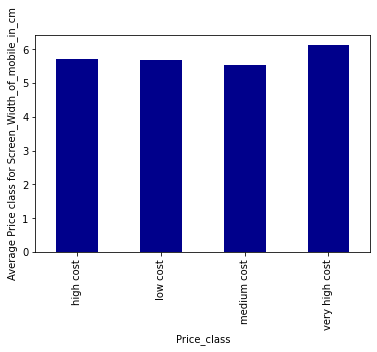

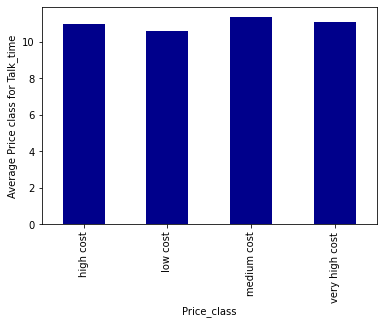

In [171]:
# QUANTITATIVE DATA
for i in df.select_dtypes('number').columns:
    plt.figure()
    df.groupby('Price_class')[i].mean().plot.bar(color='darkblue')
    plt.ylabel(f'Average Price class for {i}')

In [172]:
# QUALITATIVE DATA
for i in df.select_dtypes('O'):
    print(pd.crosstab(df[i],df['Price_class']))
    print()

Price_class  high cost  low cost  medium cost  very high cost
Bluetooth                                                    
No                 257       257          255             241
Yes                243       243          245             259

Price_class  high cost  low cost  medium cost  very high cost
Dual_sim                                                     
No                 251       250          245             235
Yes                249       250          255             265

Price_class  high cost  low cost  medium cost  very high cost
4G_Network                                                   
No                 253       241          238             225
Yes                247       259          262             275

Price_class  high cost  low cost  medium cost  very high cost
3G_Network                                                   
No                 113       127          122             115
Yes                387       373          378             385

Pric

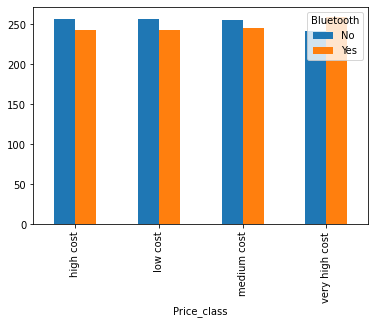

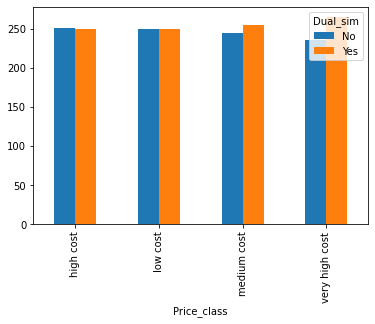

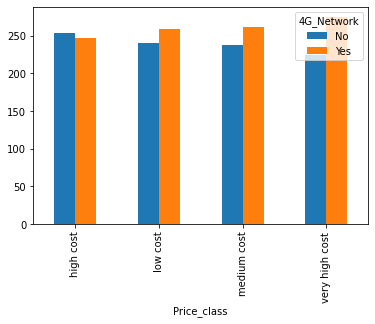

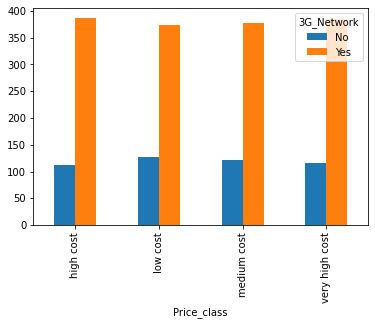

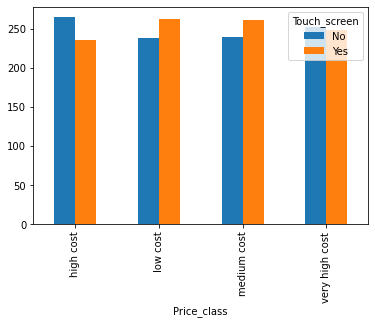

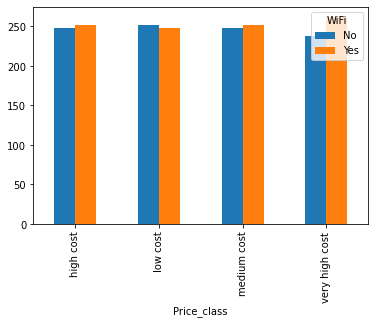

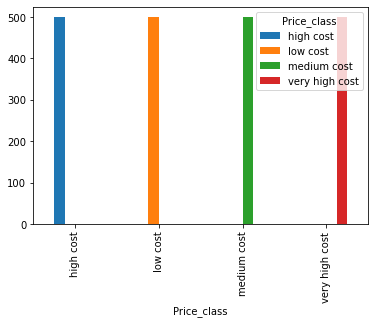

In [173]:
# QUALITATIVE DATA
for i in df.select_dtypes('O'):
    pd.crosstab(df['Price_class'],df[i]).plot.bar()


# CHECKING IF TARGET VARIABLE IS LINEARLY SEPARABLE

In [174]:
col_1  = ['Battery_power', 'Clock_speed', 'Front_Camera_MP', 'Internal_memory',
          'Mobile_Depth_in_cm', 'Weight_of_mobile_phone',
          'Number_of_processor_cores', 'pc', 'Pixel_Resolution_Height',
          'Pixel_Resolution_Width', 'Random_Access_Memory_in_MB',
          'Screen_Height_of_mobile_in_cm', 'Screen_Width_of_mobile_in_cm',
          'Talk_time']


<Figure size 432x288 with 0 Axes>

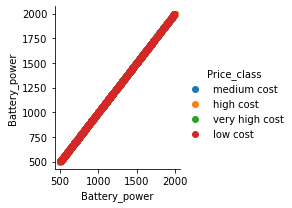

<Figure size 432x288 with 0 Axes>

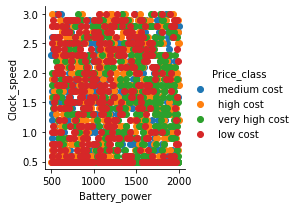

<Figure size 432x288 with 0 Axes>

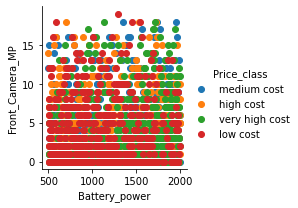

<Figure size 432x288 with 0 Axes>

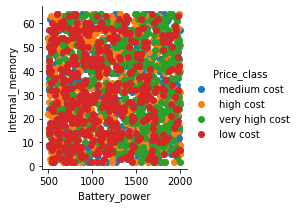

<Figure size 432x288 with 0 Axes>

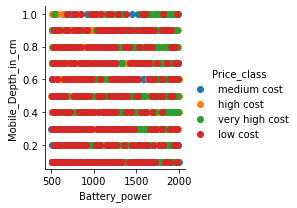

<Figure size 432x288 with 0 Axes>

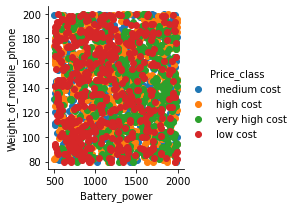

<Figure size 432x288 with 0 Axes>

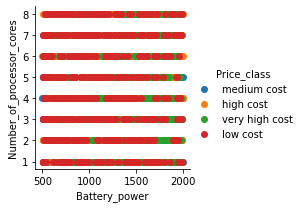

<Figure size 432x288 with 0 Axes>

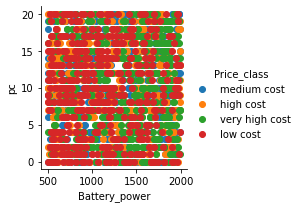

<Figure size 432x288 with 0 Axes>

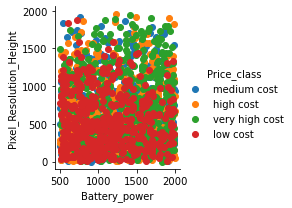

<Figure size 432x288 with 0 Axes>

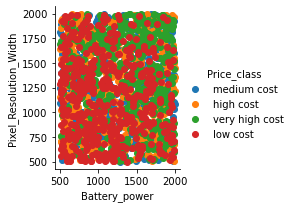

<Figure size 432x288 with 0 Axes>

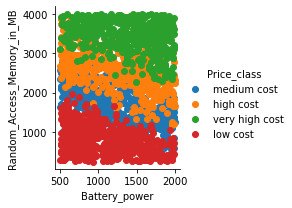

<Figure size 432x288 with 0 Axes>

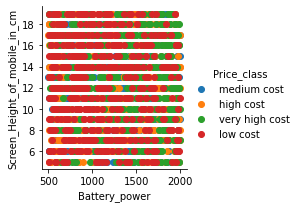

<Figure size 432x288 with 0 Axes>

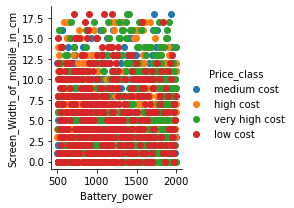

<Figure size 432x288 with 0 Axes>

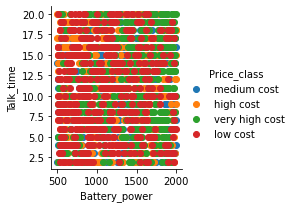

<Figure size 432x288 with 0 Axes>

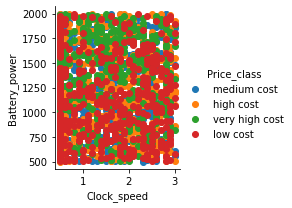

<Figure size 432x288 with 0 Axes>

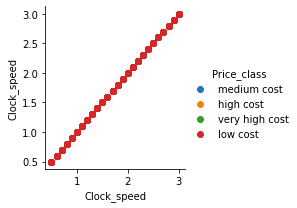

<Figure size 432x288 with 0 Axes>

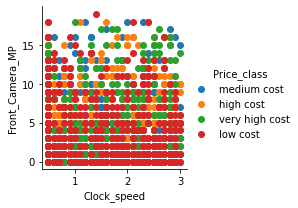

<Figure size 432x288 with 0 Axes>

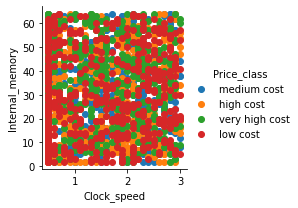

<Figure size 432x288 with 0 Axes>

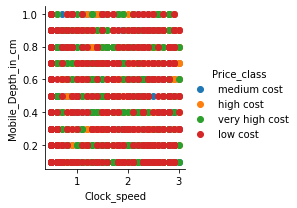

<Figure size 432x288 with 0 Axes>

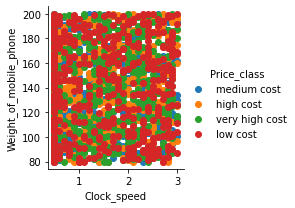

<Figure size 432x288 with 0 Axes>

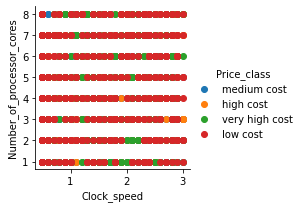

<Figure size 432x288 with 0 Axes>

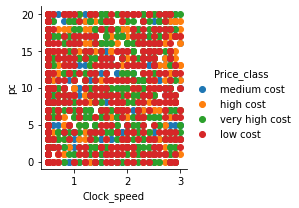

<Figure size 432x288 with 0 Axes>

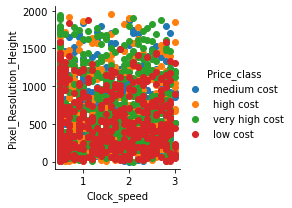

<Figure size 432x288 with 0 Axes>

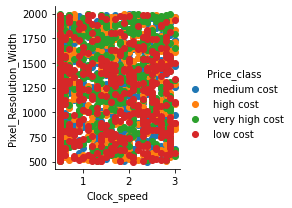

<Figure size 432x288 with 0 Axes>

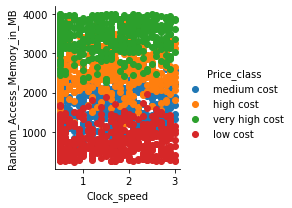

<Figure size 432x288 with 0 Axes>

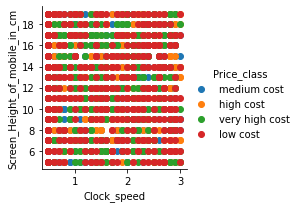

<Figure size 432x288 with 0 Axes>

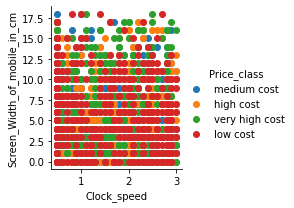

<Figure size 432x288 with 0 Axes>

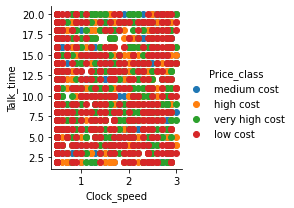

<Figure size 432x288 with 0 Axes>

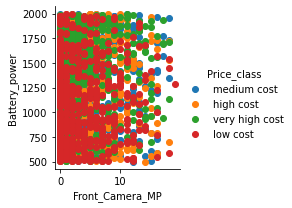

<Figure size 432x288 with 0 Axes>

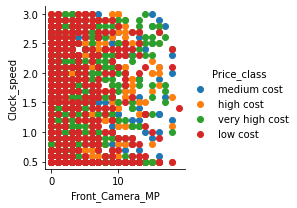

<Figure size 432x288 with 0 Axes>

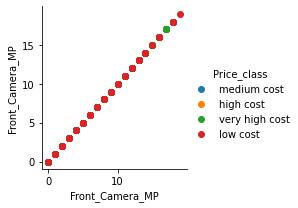

<Figure size 432x288 with 0 Axes>

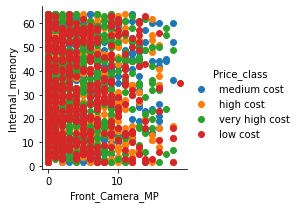

<Figure size 432x288 with 0 Axes>

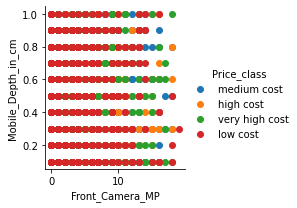

<Figure size 432x288 with 0 Axes>

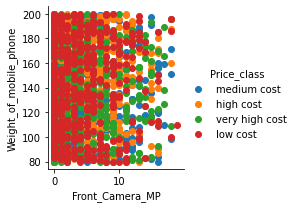

<Figure size 432x288 with 0 Axes>

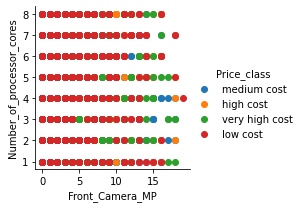

<Figure size 432x288 with 0 Axes>

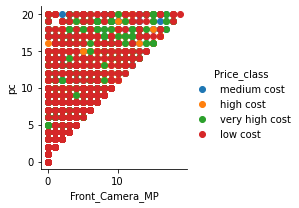

<Figure size 432x288 with 0 Axes>

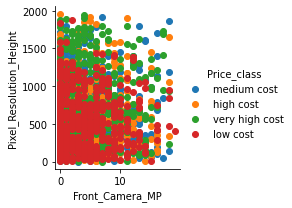

<Figure size 432x288 with 0 Axes>

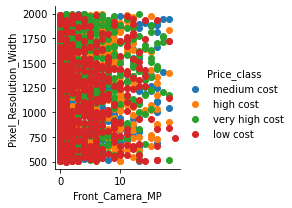

<Figure size 432x288 with 0 Axes>

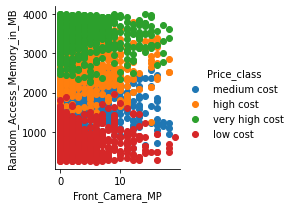

<Figure size 432x288 with 0 Axes>

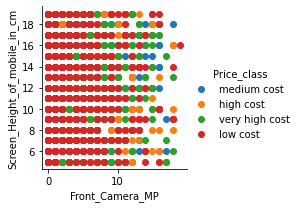

<Figure size 432x288 with 0 Axes>

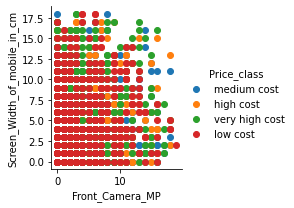

<Figure size 432x288 with 0 Axes>

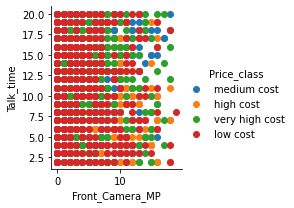

<Figure size 432x288 with 0 Axes>

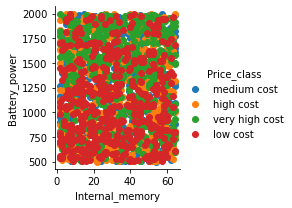

<Figure size 432x288 with 0 Axes>

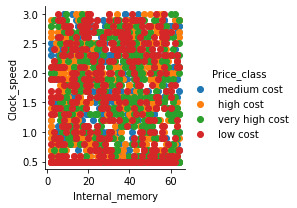

<Figure size 432x288 with 0 Axes>

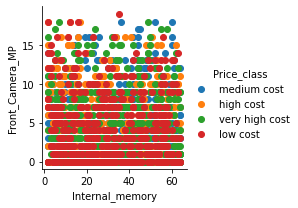

<Figure size 432x288 with 0 Axes>

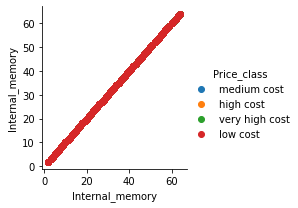

<Figure size 432x288 with 0 Axes>

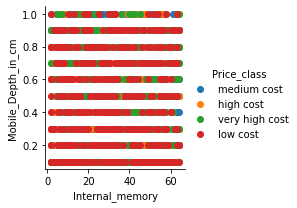

<Figure size 432x288 with 0 Axes>

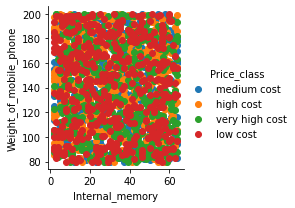

<Figure size 432x288 with 0 Axes>

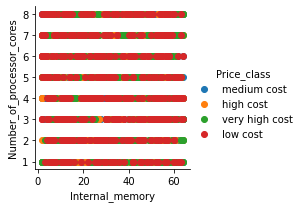

<Figure size 432x288 with 0 Axes>

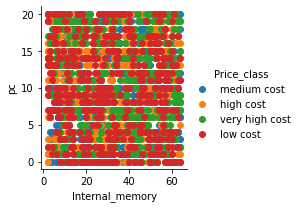

<Figure size 432x288 with 0 Axes>

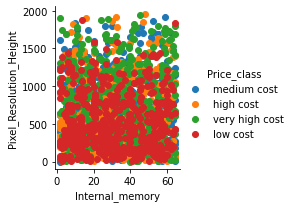

<Figure size 432x288 with 0 Axes>

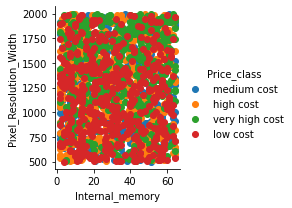

<Figure size 432x288 with 0 Axes>

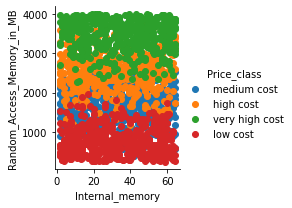

<Figure size 432x288 with 0 Axes>

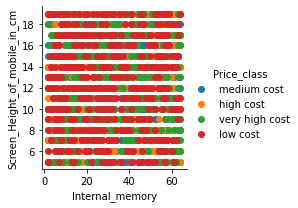

<Figure size 432x288 with 0 Axes>

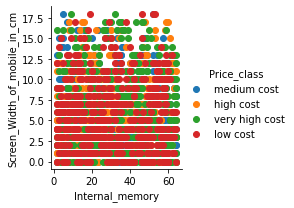

<Figure size 432x288 with 0 Axes>

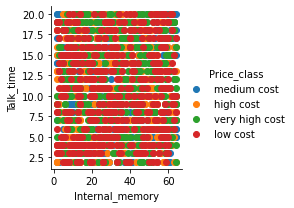

<Figure size 432x288 with 0 Axes>

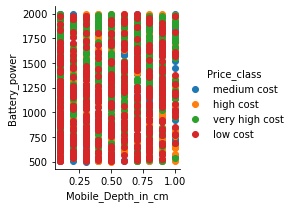

<Figure size 432x288 with 0 Axes>

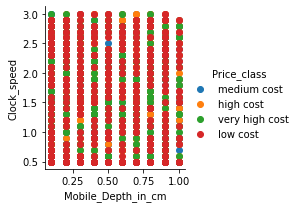

<Figure size 432x288 with 0 Axes>

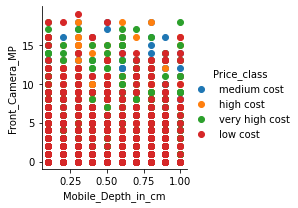

<Figure size 432x288 with 0 Axes>

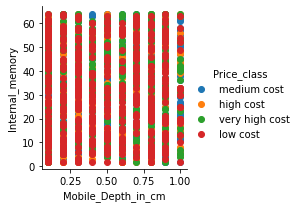

<Figure size 432x288 with 0 Axes>

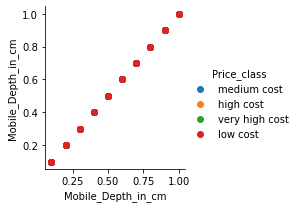

<Figure size 432x288 with 0 Axes>

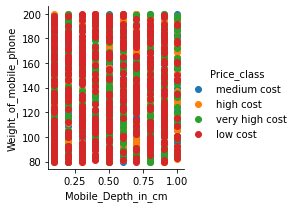

<Figure size 432x288 with 0 Axes>

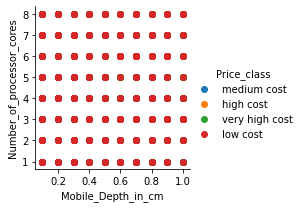

<Figure size 432x288 with 0 Axes>

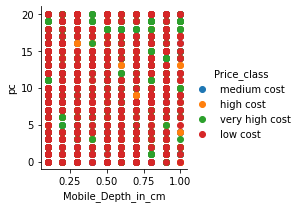

<Figure size 432x288 with 0 Axes>

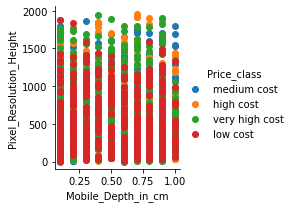

<Figure size 432x288 with 0 Axes>

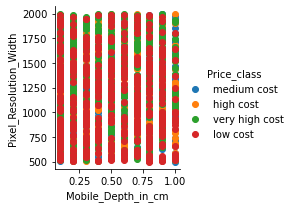

<Figure size 432x288 with 0 Axes>

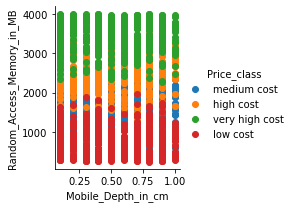

<Figure size 432x288 with 0 Axes>

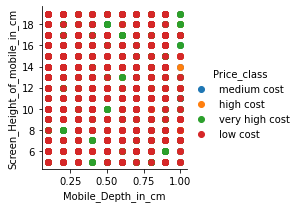

<Figure size 432x288 with 0 Axes>

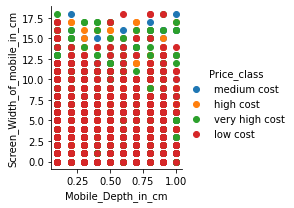

<Figure size 432x288 with 0 Axes>

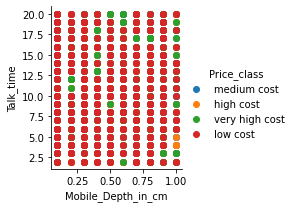

<Figure size 432x288 with 0 Axes>

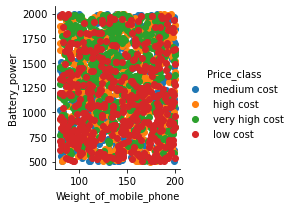

<Figure size 432x288 with 0 Axes>

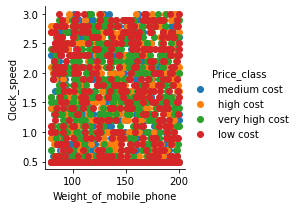

<Figure size 432x288 with 0 Axes>

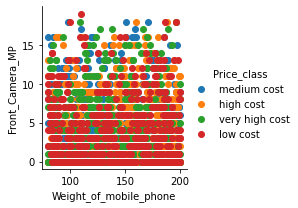

<Figure size 432x288 with 0 Axes>

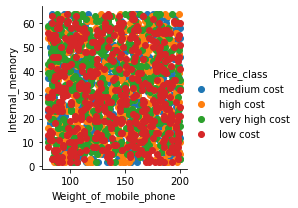

<Figure size 432x288 with 0 Axes>

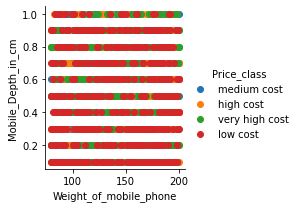

<Figure size 432x288 with 0 Axes>

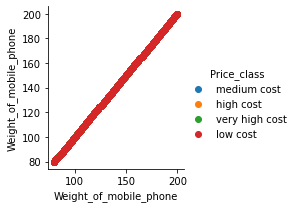

<Figure size 432x288 with 0 Axes>

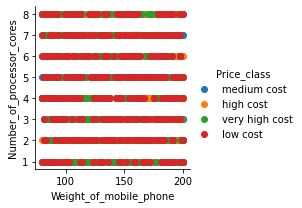

<Figure size 432x288 with 0 Axes>

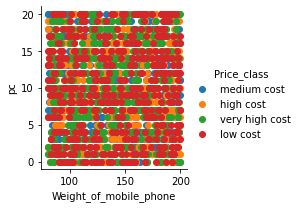

<Figure size 432x288 with 0 Axes>

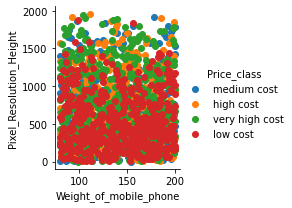

<Figure size 432x288 with 0 Axes>

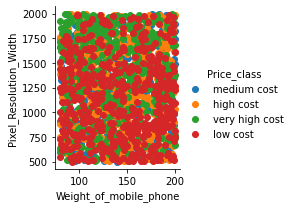

<Figure size 432x288 with 0 Axes>

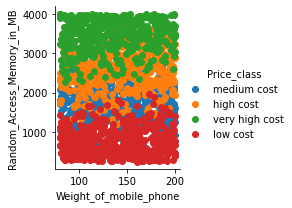

<Figure size 432x288 with 0 Axes>

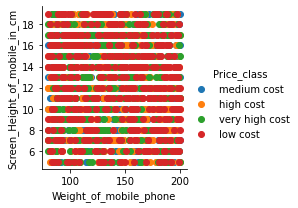

<Figure size 432x288 with 0 Axes>

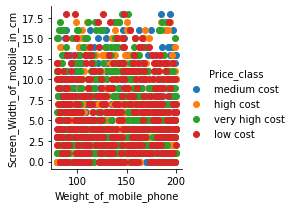

<Figure size 432x288 with 0 Axes>

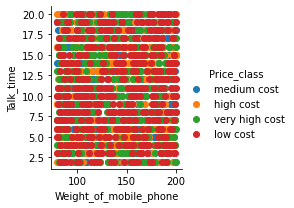

<Figure size 432x288 with 0 Axes>

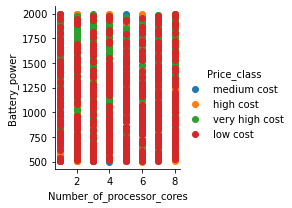

<Figure size 432x288 with 0 Axes>

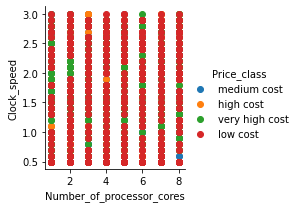

<Figure size 432x288 with 0 Axes>

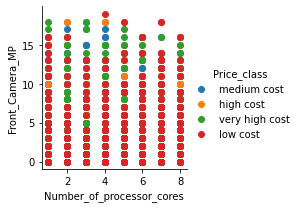

<Figure size 432x288 with 0 Axes>

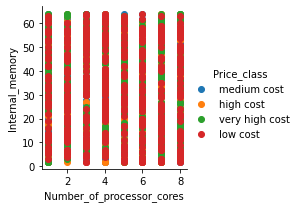

<Figure size 432x288 with 0 Axes>

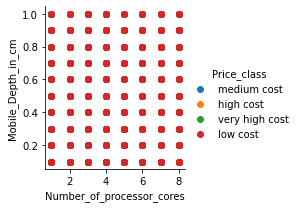

<Figure size 432x288 with 0 Axes>

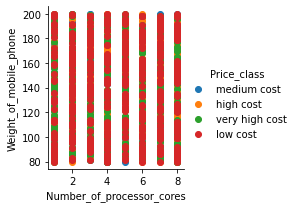

<Figure size 432x288 with 0 Axes>

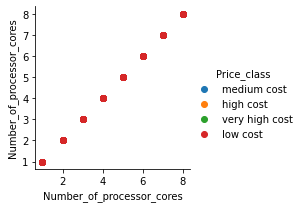

<Figure size 432x288 with 0 Axes>

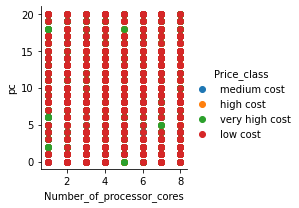

<Figure size 432x288 with 0 Axes>

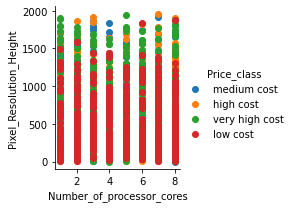

<Figure size 432x288 with 0 Axes>

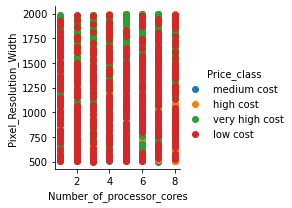

<Figure size 432x288 with 0 Axes>

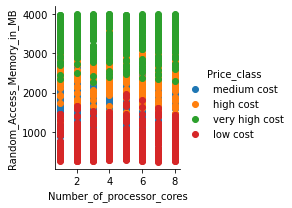

<Figure size 432x288 with 0 Axes>

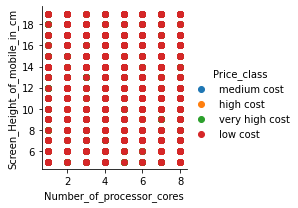

<Figure size 432x288 with 0 Axes>

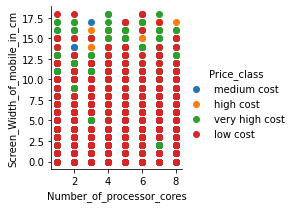

<Figure size 432x288 with 0 Axes>

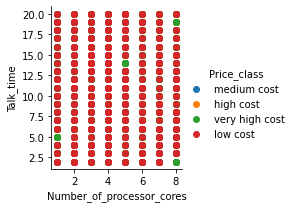

<Figure size 432x288 with 0 Axes>

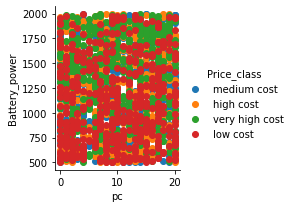

<Figure size 432x288 with 0 Axes>

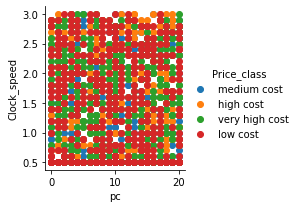

<Figure size 432x288 with 0 Axes>

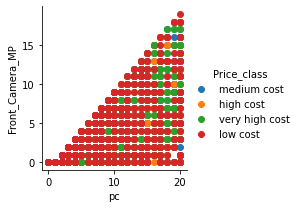

<Figure size 432x288 with 0 Axes>

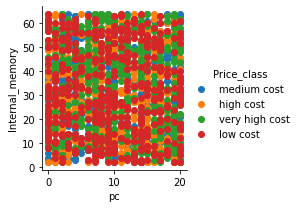

<Figure size 432x288 with 0 Axes>

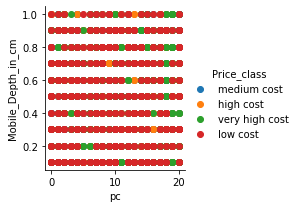

<Figure size 432x288 with 0 Axes>

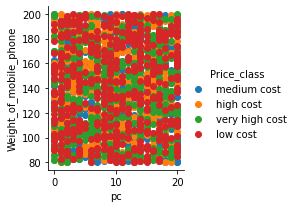

<Figure size 432x288 with 0 Axes>

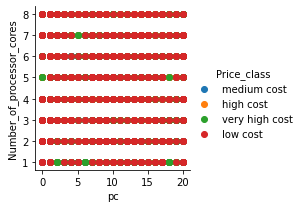

<Figure size 432x288 with 0 Axes>

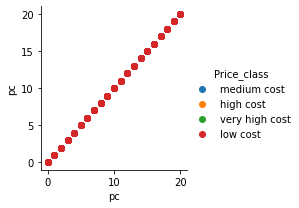

<Figure size 432x288 with 0 Axes>

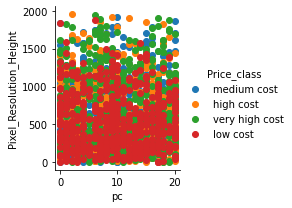

<Figure size 432x288 with 0 Axes>

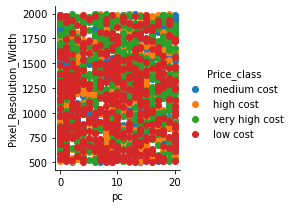

<Figure size 432x288 with 0 Axes>

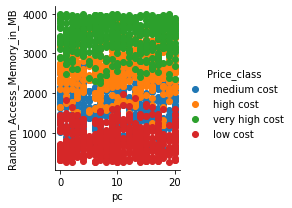

<Figure size 432x288 with 0 Axes>

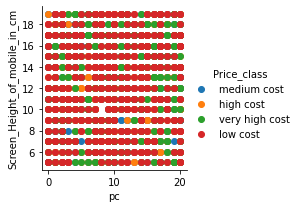

<Figure size 432x288 with 0 Axes>

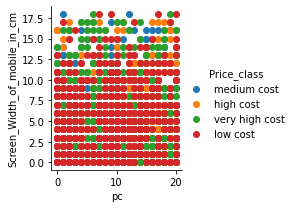

<Figure size 432x288 with 0 Axes>

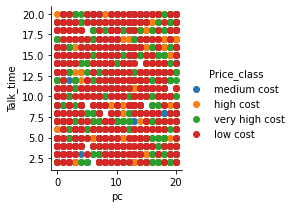

<Figure size 432x288 with 0 Axes>

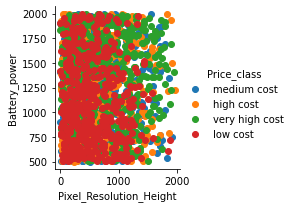

<Figure size 432x288 with 0 Axes>

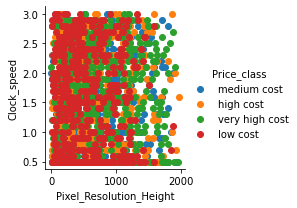

<Figure size 432x288 with 0 Axes>

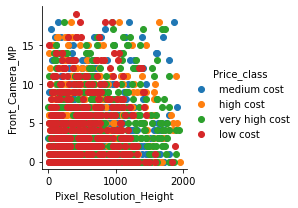

<Figure size 432x288 with 0 Axes>

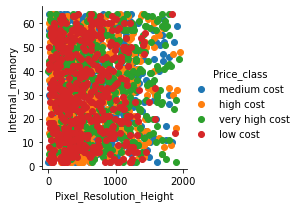

<Figure size 432x288 with 0 Axes>

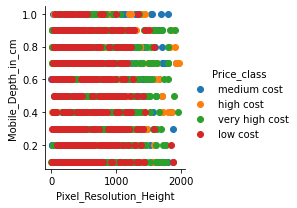

<Figure size 432x288 with 0 Axes>

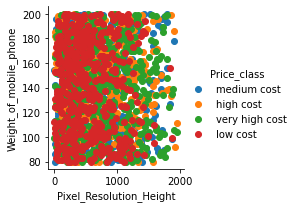

<Figure size 432x288 with 0 Axes>

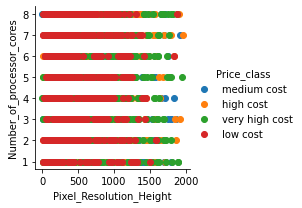

<Figure size 432x288 with 0 Axes>

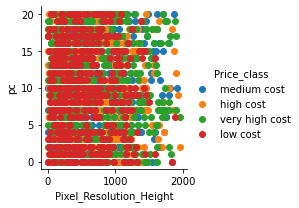

<Figure size 432x288 with 0 Axes>

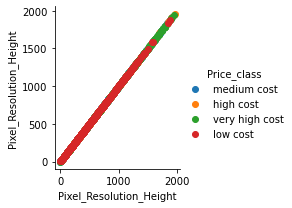

<Figure size 432x288 with 0 Axes>

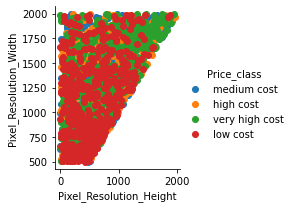

<Figure size 432x288 with 0 Axes>

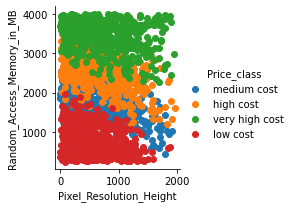

<Figure size 432x288 with 0 Axes>

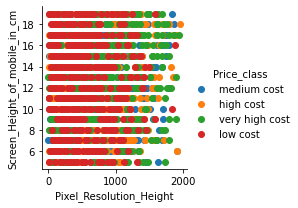

<Figure size 432x288 with 0 Axes>

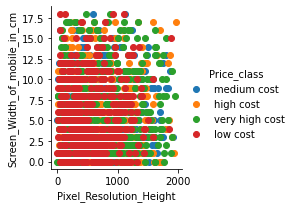

<Figure size 432x288 with 0 Axes>

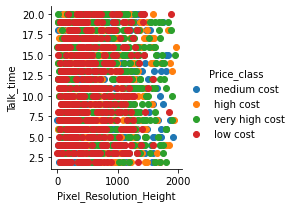

<Figure size 432x288 with 0 Axes>

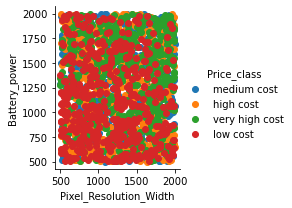

<Figure size 432x288 with 0 Axes>

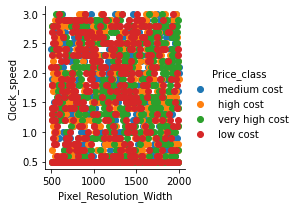

<Figure size 432x288 with 0 Axes>

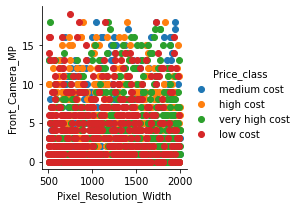

<Figure size 432x288 with 0 Axes>

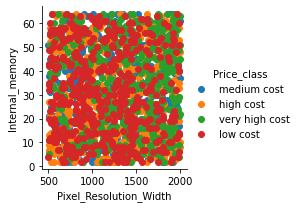

<Figure size 432x288 with 0 Axes>

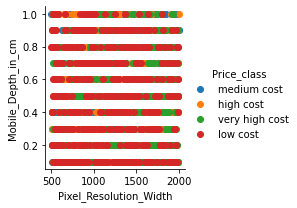

<Figure size 432x288 with 0 Axes>

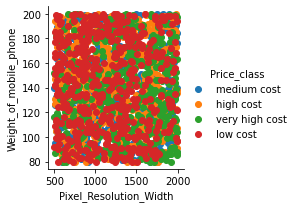

<Figure size 432x288 with 0 Axes>

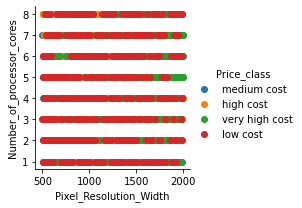

<Figure size 432x288 with 0 Axes>

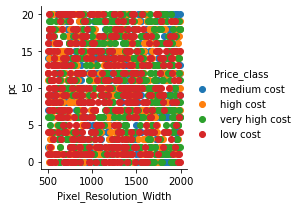

<Figure size 432x288 with 0 Axes>

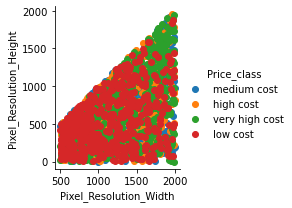

<Figure size 432x288 with 0 Axes>

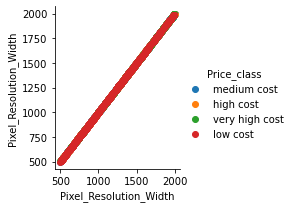

<Figure size 432x288 with 0 Axes>

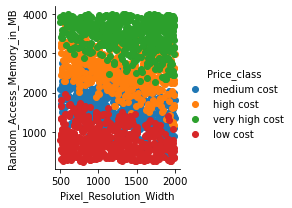

<Figure size 432x288 with 0 Axes>

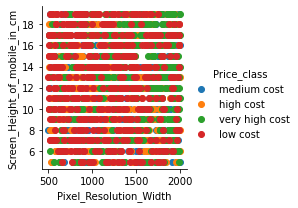

<Figure size 432x288 with 0 Axes>

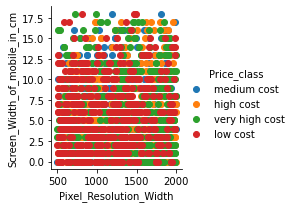

<Figure size 432x288 with 0 Axes>

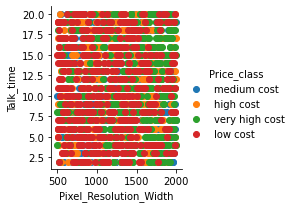

<Figure size 432x288 with 0 Axes>

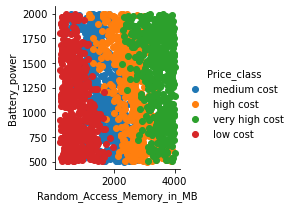

<Figure size 432x288 with 0 Axes>

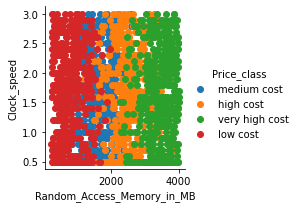

<Figure size 432x288 with 0 Axes>

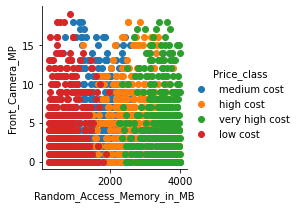

<Figure size 432x288 with 0 Axes>

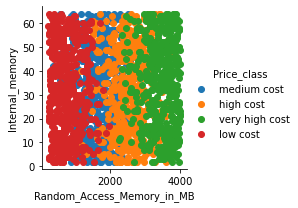

<Figure size 432x288 with 0 Axes>

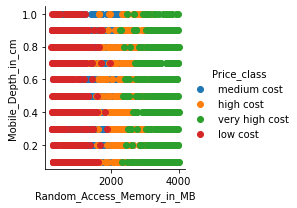

<Figure size 432x288 with 0 Axes>

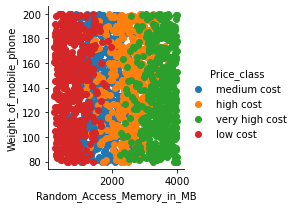

<Figure size 432x288 with 0 Axes>

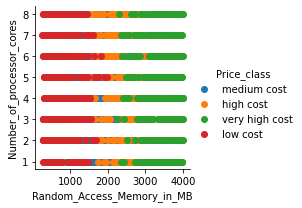

<Figure size 432x288 with 0 Axes>

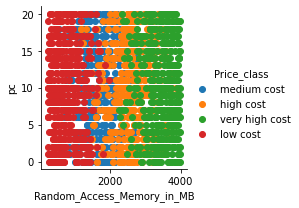

<Figure size 432x288 with 0 Axes>

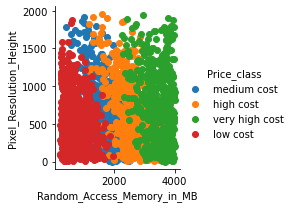

<Figure size 432x288 with 0 Axes>

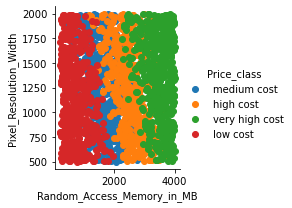

<Figure size 432x288 with 0 Axes>

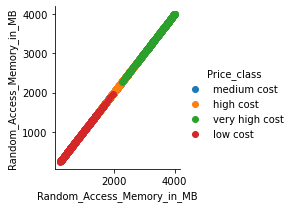

<Figure size 432x288 with 0 Axes>

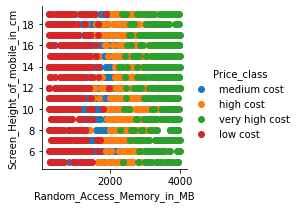

<Figure size 432x288 with 0 Axes>

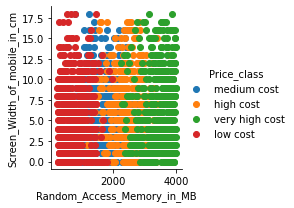

<Figure size 432x288 with 0 Axes>

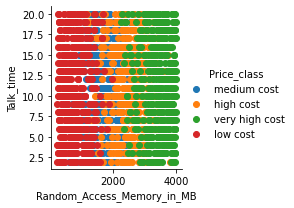

<Figure size 432x288 with 0 Axes>

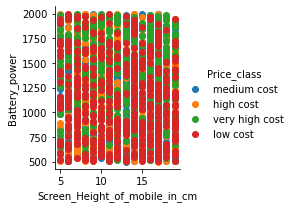

<Figure size 432x288 with 0 Axes>

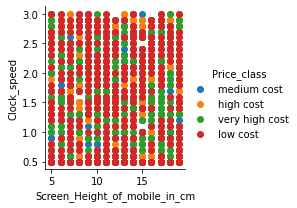

<Figure size 432x288 with 0 Axes>

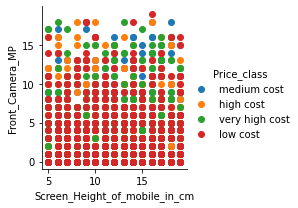

<Figure size 432x288 with 0 Axes>

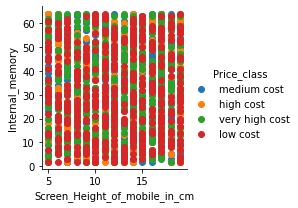

<Figure size 432x288 with 0 Axes>

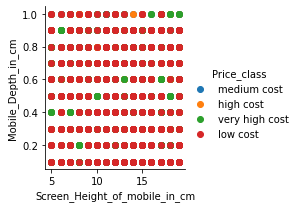

<Figure size 432x288 with 0 Axes>

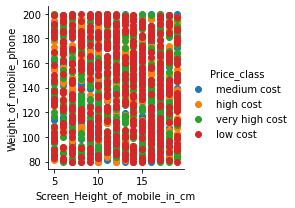

<Figure size 432x288 with 0 Axes>

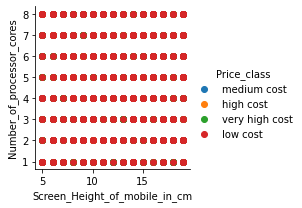

<Figure size 432x288 with 0 Axes>

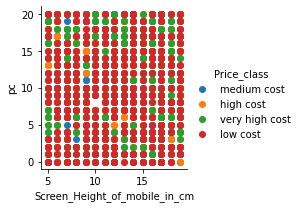

<Figure size 432x288 with 0 Axes>

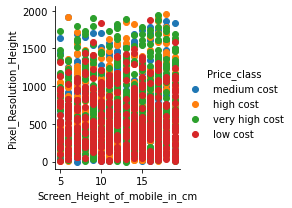

<Figure size 432x288 with 0 Axes>

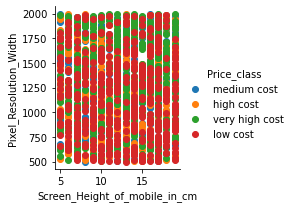

<Figure size 432x288 with 0 Axes>

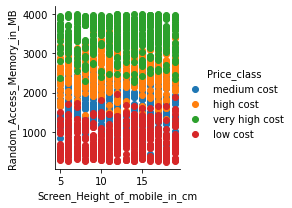

<Figure size 432x288 with 0 Axes>

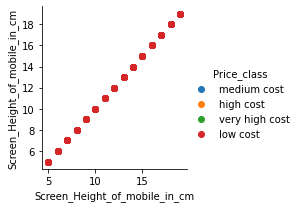

<Figure size 432x288 with 0 Axes>

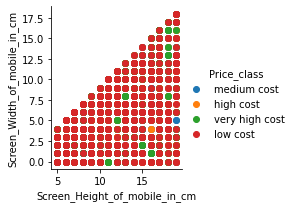

<Figure size 432x288 with 0 Axes>

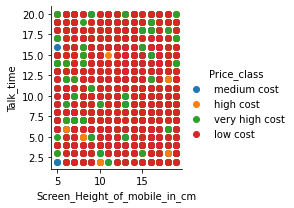

<Figure size 432x288 with 0 Axes>

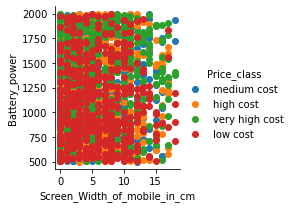

<Figure size 432x288 with 0 Axes>

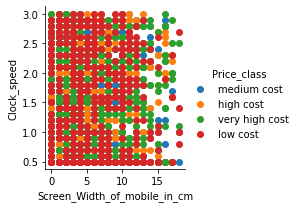

<Figure size 432x288 with 0 Axes>

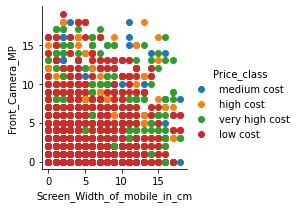

<Figure size 432x288 with 0 Axes>

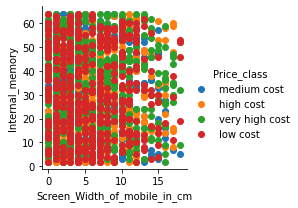

<Figure size 432x288 with 0 Axes>

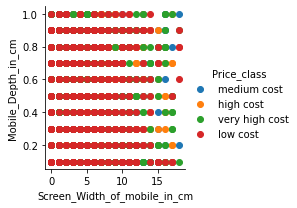

<Figure size 432x288 with 0 Axes>

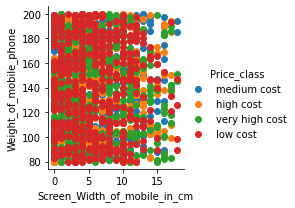

<Figure size 432x288 with 0 Axes>

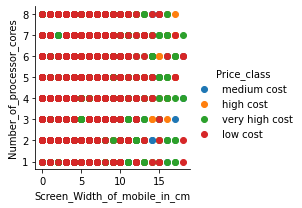

<Figure size 432x288 with 0 Axes>

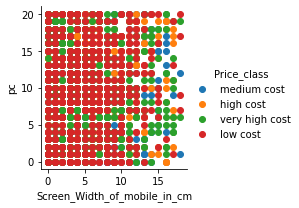

<Figure size 432x288 with 0 Axes>

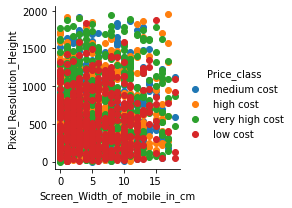

<Figure size 432x288 with 0 Axes>

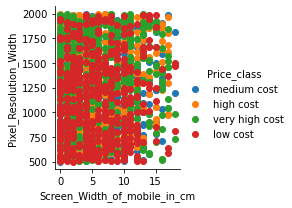

<Figure size 432x288 with 0 Axes>

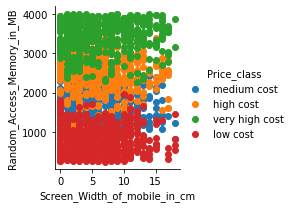

<Figure size 432x288 with 0 Axes>

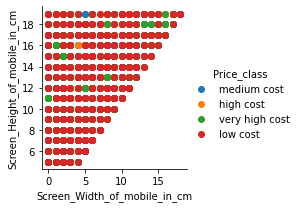

<Figure size 432x288 with 0 Axes>

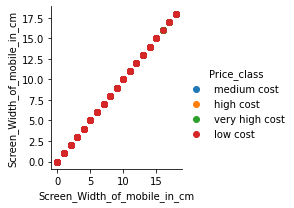

<Figure size 432x288 with 0 Axes>

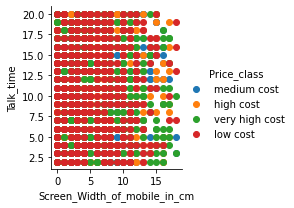

<Figure size 432x288 with 0 Axes>

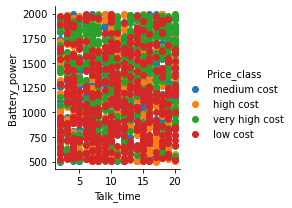

<Figure size 432x288 with 0 Axes>

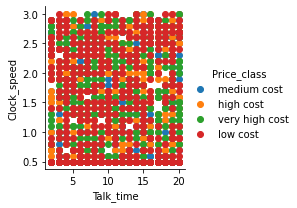

<Figure size 432x288 with 0 Axes>

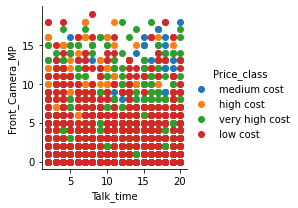

<Figure size 432x288 with 0 Axes>

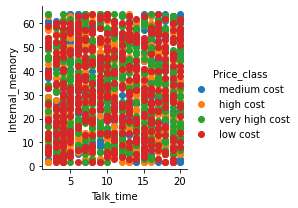

<Figure size 432x288 with 0 Axes>

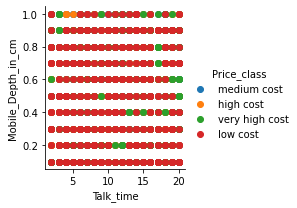

<Figure size 432x288 with 0 Axes>

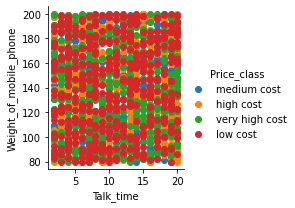

<Figure size 432x288 with 0 Axes>

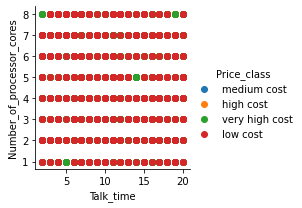

<Figure size 432x288 with 0 Axes>

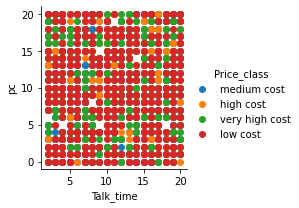

<Figure size 432x288 with 0 Axes>

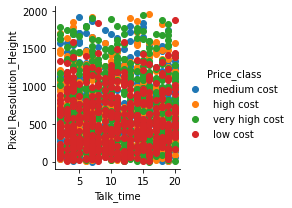

<Figure size 432x288 with 0 Axes>

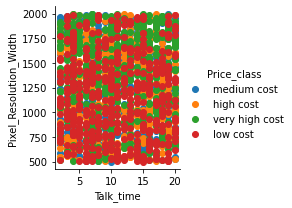

<Figure size 432x288 with 0 Axes>

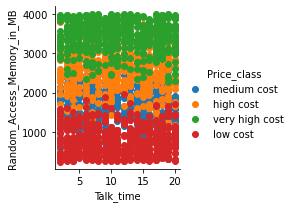

<Figure size 432x288 with 0 Axes>

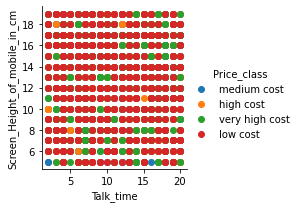

<Figure size 432x288 with 0 Axes>

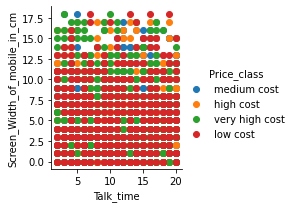

<Figure size 432x288 with 0 Axes>

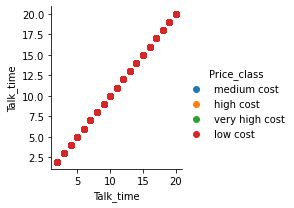

In [175]:
for i in col_1:
    for y in col_1:
        plt.figure()
        sns.FacetGrid(df,hue='Price_class').map(plt.scatter,i,y).add_legend()

<Figure size 2880x2880 with 0 Axes>

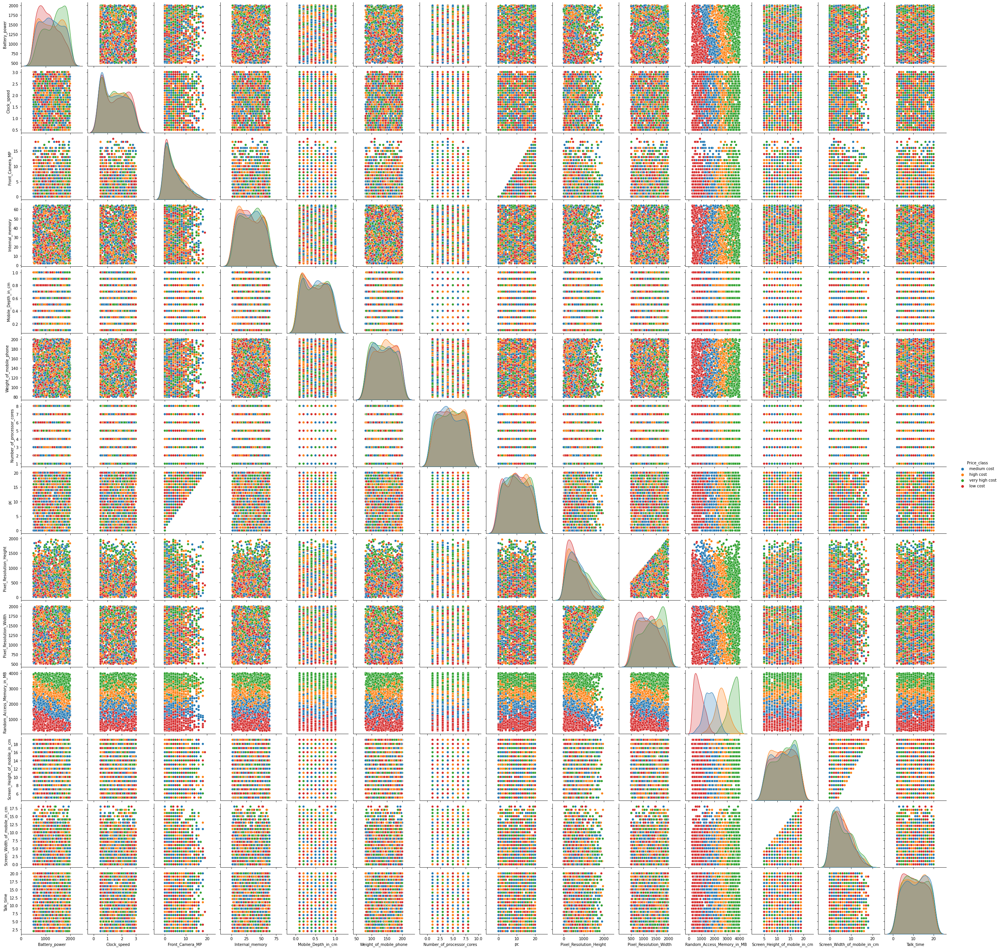

In [176]:
plt.figure(figsize=(40,40))
sns.pairplot(df,hue='Price_class')

# CORRELATION/MULTICOLLINEARITY

<AxesSubplot:>

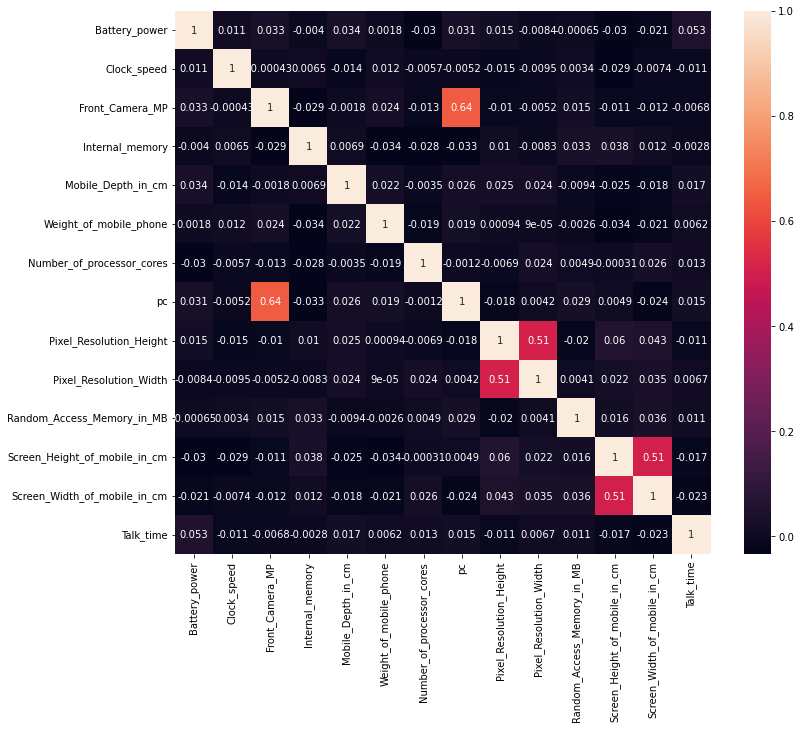

In [177]:
plt.figure(figsize=(12,10))
sns.heatmap(df.corr(),annot=True)

# CHECKING FOR NORMALITY

In [178]:
for i in df.select_dtypes('number'):
    print('Variable:', i.upper())
    pvalue = scipy.stats.shapiro(df[i])[1]
    if pvalue<0.05:
        print('Null Hypothesis rejected. Data is not normal')
    else:
        print('Null hypothesis accepted. Data is normal')
    print()

Variable: BATTERY_POWER
Null Hypothesis rejected. Data is not normal

Variable: CLOCK_SPEED
Null Hypothesis rejected. Data is not normal

Variable: FRONT_CAMERA_MP
Null Hypothesis rejected. Data is not normal

Variable: INTERNAL_MEMORY
Null Hypothesis rejected. Data is not normal

Variable: MOBILE_DEPTH_IN_CM
Null Hypothesis rejected. Data is not normal

Variable: WEIGHT_OF_MOBILE_PHONE
Null Hypothesis rejected. Data is not normal

Variable: NUMBER_OF_PROCESSOR_CORES
Null Hypothesis rejected. Data is not normal

Variable: PC
Null Hypothesis rejected. Data is not normal

Variable: PIXEL_RESOLUTION_HEIGHT
Null Hypothesis rejected. Data is not normal

Variable: PIXEL_RESOLUTION_WIDTH
Null Hypothesis rejected. Data is not normal

Variable: RANDOM_ACCESS_MEMORY_IN_MB
Null Hypothesis rejected. Data is not normal

Variable: SCREEN_HEIGHT_OF_MOBILE_IN_CM
Null Hypothesis rejected. Data is not normal

Variable: SCREEN_WIDTH_OF_MOBILE_IN_CM
Null Hypothesis rejected. Data is not normal

Variable: 

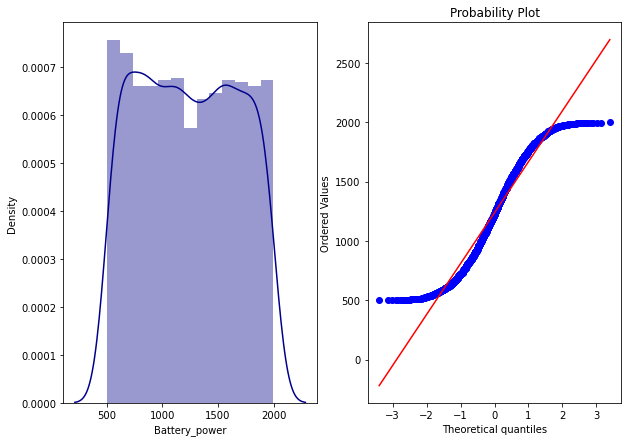

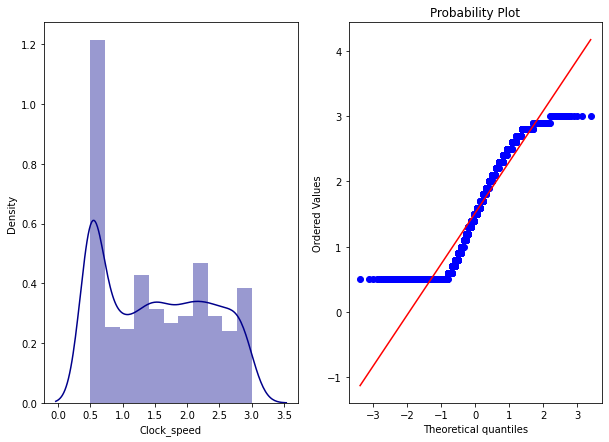

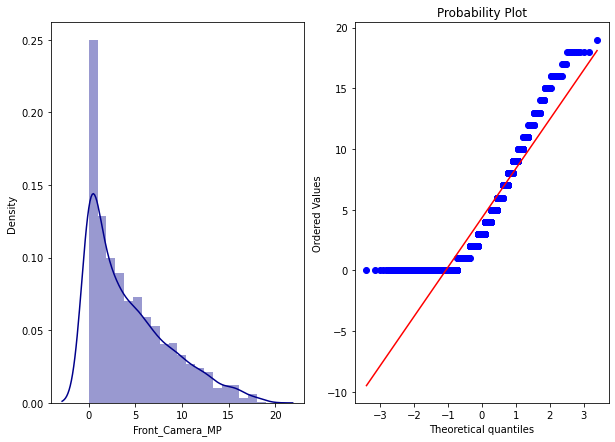

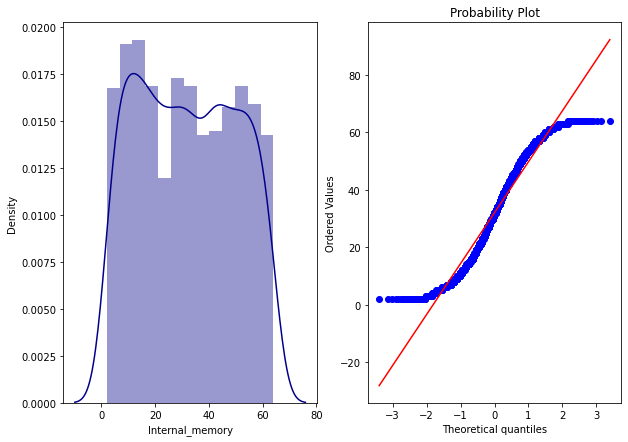

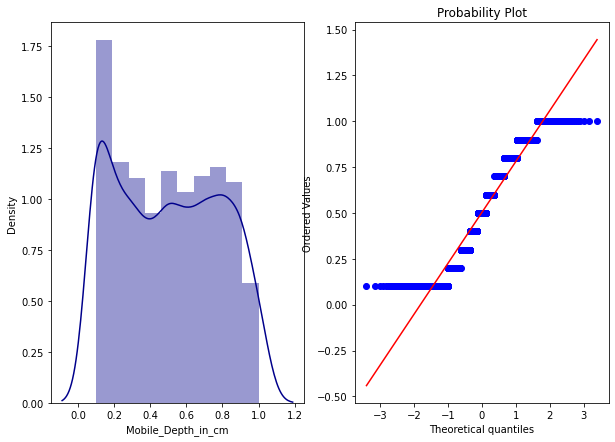

...

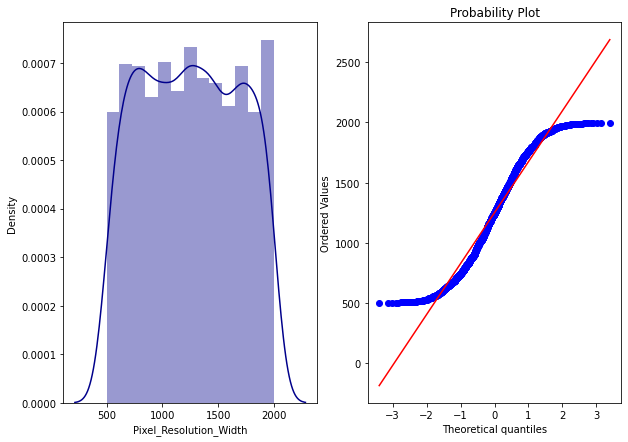

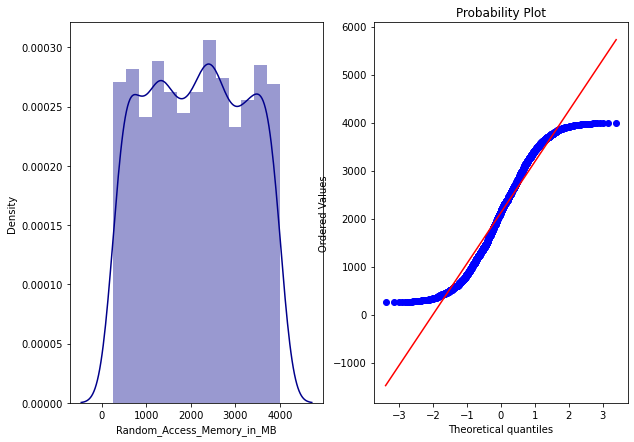

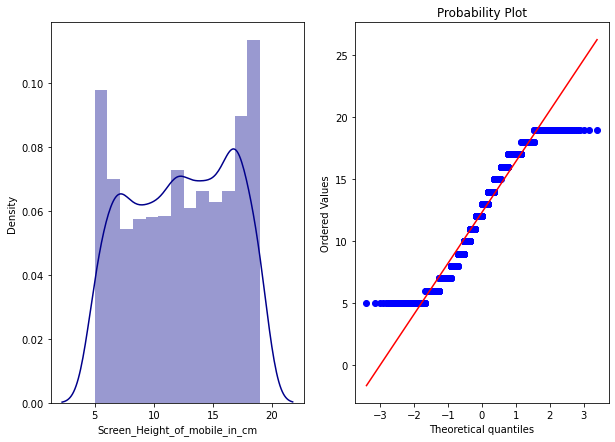

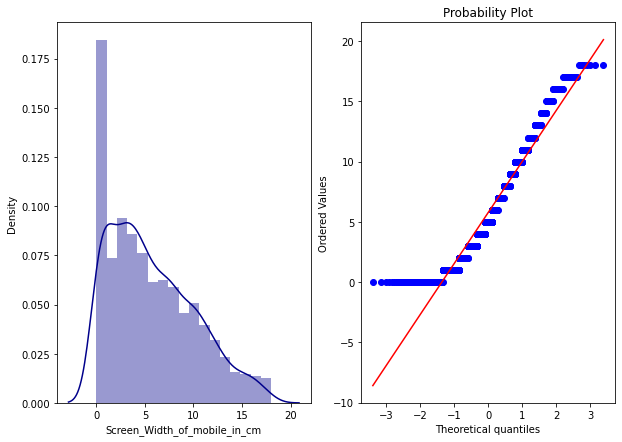

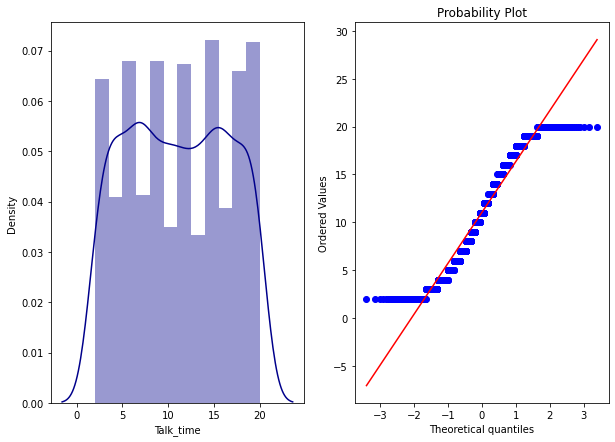

In [179]:
#visualizing normality
import warnings
warnings.filterwarnings('ignore')
def normality_check(data, column):
    plt.figure(figsize=(10,7))
    plt.subplot(121)
    sns.distplot(data[column],kde=True, color='darkblue')
    
    plt.subplot(122)
    scipy.stats.probplot(data[column], dist='norm',plot=plt)
    
    
for i in df.select_dtypes('number').columns:
    normality_check(df, i)

# CHECKING FOR OUTLIERS

In [180]:
# BOXPLOT
for i in df.select_dtypes('number').columns:
    plt.figure()
    px.box(df,i).show()

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [181]:
# IQR PROXIMITY RULE
def iqr_outliers(data,variable):
    Q3 = data[variable].quantile(0.75)
    Q1 = data[variable].quantile(0.25)
    
    IQR = Q3 -Q1
    
    upper_limit = Q3 + 1.5*IQR
    lower_limit = Q1 - 1.5*IQR
    
    return upper_limit,lower_limit

In [182]:
upper_limit,lower_limit=iqr_outliers(df,'Battery_power')
df.loc[np.where(df['Battery_power']>upper_limit, True, np.where(df['Battery_power']<lower_limit, True, False))]

,Battery_power,Bluetooth,Clock_speed,Dual_sim,Front_Camera_MP,4G_Network,Internal_memory,Mobile_Depth_in_cm,Weight_of_mobile_phone,Number_of_processor_cores,pc,Pixel_Resolution_Height,Pixel_Resolution_Width,Random_Access_Memory_in_MB,Screen_Height_of_mobile_in_cm,Screen_Width_of_mobile_in_cm,Talk_time,3G_Network,Touch_screen,WiFi,Price_class


# SPLIT DATA

In [183]:
target = data['price_range']
features = data.drop(['price_range'],axis=1)
xtrain, xval, ytrain, yval = train_test_split(features,target, test_size = 0.2, random_state = 0)

In [184]:
p_map={ 0:'low cost', 1:'medium cost' ,2:'high cost',3:'very high cost'}
print(ytrain.value_counts().rename(index=p_map))#checking for data imbalance

medium cost       408
low cost          405
high cost         401
very high cost    386
Name: price_range, dtype: int64


# 10-Fold Cross Validation

In [185]:
models = []

models.append(('Tree',DecisionTreeClassifier()))
models.append(('KNN',KNeighborsClassifier()))
models.append(('GaussianNB',GaussianNB()))
models.append(('SVC',SVC()))

#BAGGING ALGORITHMS
models.append(('Rforest',RandomForestClassifier()))
models.append(('ExtraTrees',ExtraTreesClassifier()))

#BOOSTING ALGORITHMS
models.append(('Adaboost',AdaBoostClassifier()))
models.append(('GBoost',GradientBoostingClassifier()))

#NEURAL NETWORK
models.append(('MLP',MLPClassifier()))


In [186]:
results = []
names = []
for name, model in models:
    names.append(name)
    kfold = KFold(n_splits=10)
    cv_results = cross_val_score(model, xtrain, ytrain, cv=kfold, scoring='accuracy')
    results.append(cv_results)

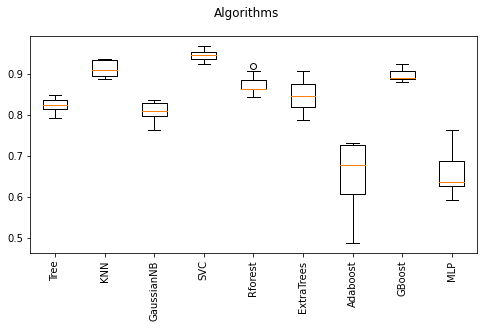

In [187]:
# COMPARING ALGORITHMS
fig = plt.figure()
fig.suptitle('Algorithms')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=90)
fig.set_size_inches(8,4)
plt.show()

In [188]:
# TESTING
model = SVC()
model.fit(xtrain, ytrain)
ypred = model.predict(xval)

print(accuracy_score(yval,ypred))
print(classification_report(yval,ypred))

0.955
              precision    recall  f1-score   support

           0       0.97      0.99      0.98        95
           1       0.94      0.96      0.95        92
           2       0.97      0.89      0.93        99
           3       0.95      0.98      0.97       114

    accuracy                           0.95       400
   macro avg       0.96      0.95      0.95       400
weighted avg       0.96      0.95      0.95       400



<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

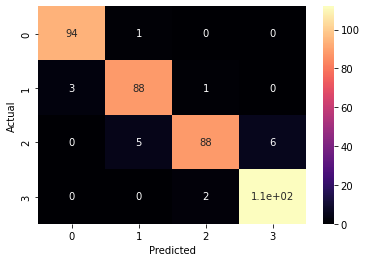

In [189]:
# CONFUSION MATRIX
cm = pd.DataFrame(confusion_matrix(yval, ypred), columns = np.unique(yval), index = np.unique(yval))

cm.index.name = 'Actual'
cm.columns.name = 'Predicted'

sns.heatmap(cm, cmap='magma', annot=True)

# HYPERPARAMETER TUNING OF SVC

In [190]:
params={
    'kernel':['linear', 'poly', 'rbf', 'sigmoid'],
    'C':[0.1,1,10,100],
    'class_weight':['dict', 'balanced'],
    'gamma':[1,0.1,0.01,0.001],
    'decision_function_shape':['ovo', 'ovr']
}

In [191]:
randomized_search=RandomizedSearchCV(SVC(),param_distributions=params,n_iter=3,scoring='accuracy',verbose=3)

In [192]:
randomized_search.fit(xval,yval)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5] END C=10, class_weight=dict, decision_function_shape=ovo, gamma=0.1, kernel=rbf;, score=nan total time=   0.0s
[CV 2/5] END C=10, class_weight=dict, decision_function_shape=ovo, gamma=0.1, kernel=rbf;, score=nan total time=   0.0s
[CV 3/5] END C=10, class_weight=dict, decision_function_shape=ovo, gamma=0.1, kernel=rbf;, score=nan total time=   0.0s
[CV 4/5] END C=10, class_weight=dict, decision_function_shape=ovo, gamma=0.1, kernel=rbf;, score=nan total time=   0.0s
[CV 5/5] END C=10, class_weight=dict, decision_function_shape=ovo, gamma=0.1, kernel=rbf;, score=nan total time=   0.0s
[CV 1/5] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=1, kernel=linear;, score=0.975 total time=   0.0s
[CV 2/5] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=1, kernel=linear;, score=0.938 total time=   0.0s
[CV 3/5] END C=1, class_weight=balanced, decision_function_shape=ovo, gamma=1, kernel=li

RandomizedSearchCV(estimator=SVC(), n_iter=3,
                   param_distributions={'C': [0.1, 1, 10, 100],
                                        'class_weight': ['dict', 'balanced'],
                                        'decision_function_shape': ['ovo',
                                                                    'ovr'],
                                        'gamma': [1, 0.1, 0.01, 0.001],
                                        'kernel': ['linear', 'poly', 'rbf',
                                                   'sigmoid']},
                   scoring='accuracy', verbose=3)

In [193]:
svc_model=randomized_search.best_estimator_
svc_model

SVC(C=1, class_weight='balanced', decision_function_shape='ovo', gamma=1,
    kernel='linear')

In [194]:
svc_scores=cross_val_predict(svc_model,xval,yval,cv=10)

In [195]:
print(classification_report(yval,svc_scores))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97        95
           1       0.95      0.95      0.95        92
           2       0.96      0.94      0.95        99
           3       0.96      0.99      0.97       114

    accuracy                           0.96       400
   macro avg       0.96      0.96      0.96       400
weighted avg       0.96      0.96      0.96       400



<AxesSubplot:>

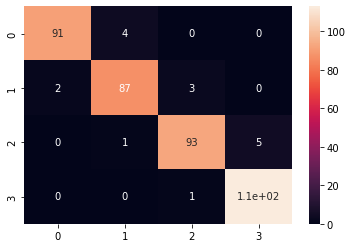

In [196]:
sns.heatmap(confusion_matrix(yval,svc_scores),annot=True)

# TESTING MODEL


In [197]:
test  = pd.read_csv("/Users/USER/Documents/DATASETS/mobile_price_classification/test.csv")
test_copy = test.copy()
test_copy=test_copy.drop(['id'],axis=1)
test_pred = pd.DataFrame(svc_model.predict(test_copy), columns=['Predicted_class'])

In [198]:
pd.concat([test['id'],test_pred],axis=1)

,id,Predicted_class
0,1,3
1,2,3
2,3,3
3,4,3
4,5,1
...,...,...
995,996,2
996,997,1
997,998,0
998,999,2


# SAVING MODEL

In [199]:
filename='Mobile_Price_Classification.sav'
pickle.dump(svc_model,open(filename,'wb'))
#loading the saved model
model=pickle.load(open('Mobile_Price_Classification.sav','rb'))